In [1]:
import numpy as np
import matplotlib.cm as cm
from matplotlib import ticker
import math
import scipy
from scipy import spatial
import matplotlib.pyplot as plt
import matplotlib
import xarray as xr
import dask
from sklearn.neighbors import KDTree
import netCDF4

from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import axes3d
from IPython.display import HTML
from matplotlib import animation

In [2]:
fz = 15*1.5
lw = 4
siz = 100
XNNA = 1.25 # Abscissa where architecture-constrained network will be placed
XTEXT = 0.25 # Text placement
YTEXT = 0.3 # Text placement

plt.rc('text', usetex=False)
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
#mpl.rcParams["font.serif"] = "STIX"
plt.rc('font', family='serif', size=fz)
matplotlib.rcParams['lines.linewidth'] = lw

In [3]:
others = netCDF4.Dataset("/fast/gmooers/Raw_Data/extras/TimestepOutput_Neuralnet_SPCAM_216.cam.h1.2009-01-01-00000.nc")
levs = np.array(others.variables['lev'])
lons = np.array(others.variables['lon'])
new = np.flip(levs)
crms = np.arange(1,129,1)
Xs, Zs = np.meshgrid(crms, new)

In [4]:
z_test_tsne_track = np.load("//fast/gmooers/gmooers_git/CBRAIN-CAM/MAPS/model_graphs/latent_space/3D_PCA_Latent_Space__31.npy")

Test_Images = np.load("/fast/gmooers/Preprocessed_Data/W_Variable/Trackable_Space_Time_W_Test.npy")

Max_Scalar = np.load("/fast/gmooers/Preprocessed_Data/Centered_50_50/Space_Time_Max_Scalar.npy")
Min_Scalar = np.load("/fast/gmooers/Preprocessed_Data/Centered_50_50/Space_Time_Min_Scalar.npy")

Test_Images = np.interp(Test_Images, (0, 1), (Min_Scalar, Max_Scalar))

In [5]:
W_0 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-1,:])), axis=1)
W_1 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-2,:])), axis=1)
W_2 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-3,:])), axis=1)
W_3 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-4,:])), axis=1)
W_4 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-5,:])), axis=1)
W_5 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-6,:])), axis=1)
W_6 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-7,:])), axis=1)
W_7 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-8,:])), axis=1)
W_8 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-9,:])), axis=1)
W_9 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-10,:])), axis=1)
W_10 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-11,:])), axis=1)
W_11 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-12,:])), axis=1)
W_12 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-13,:])), axis=1)
W_13 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-14,:])), axis=1)
W_14 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-15,:])), axis=1)
W_15 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-16,:])), axis=1)
W_16 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-17,:])), axis=1)
W_17 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-18,:])), axis=1)
W_18 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-19,:])), axis=1)
W_19 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-20,:])), axis=1)
W_20 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-21,:])), axis=1)
W_21 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-22,:])), axis=1)
W_22 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-23,:])), axis=1)
W_23 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-24,:])), axis=1)
W_24 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-25,:])), axis=1)
W_25 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-26,:])), axis=1)
W_26 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-27,:])), axis=1)
W_27 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-28,:])), axis=1)
W_28 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-29,:])), axis=1)
W_29 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-30,:])), axis=1)

-0.6504535614533724
0.024741783509266972
0.6395173998852907


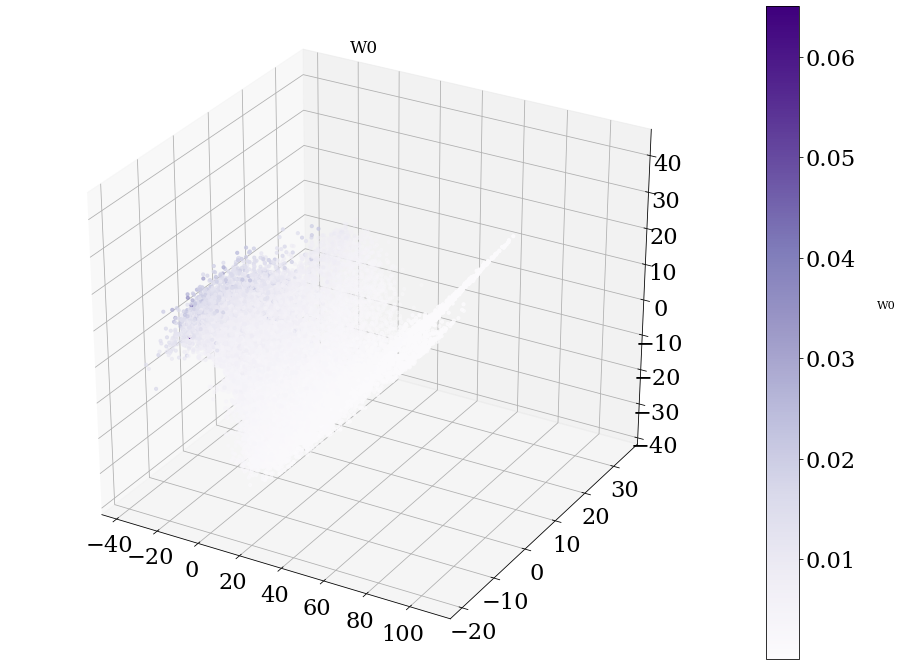

In [6]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_0, cmap="Purples", s=10.0)
ax.set_title("W0", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W0", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_0)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_0)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_0)[0])

-0.7647516653729582
0.13301823021145287
0.5755131136181115


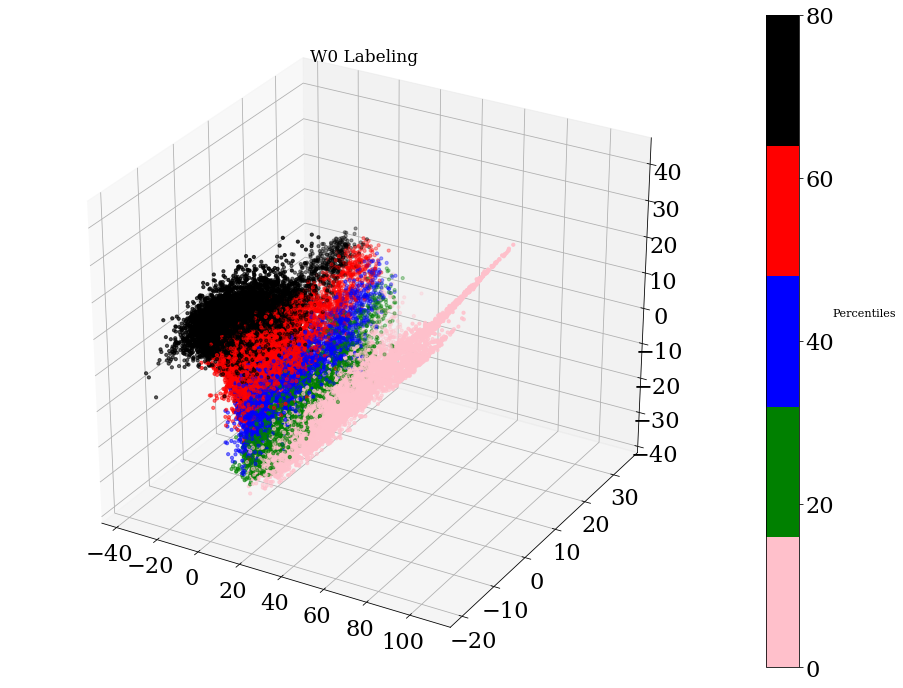

In [7]:
quintiles = np.percentile(W_0, [20,40,60,80])
out = np.searchsorted(quintiles,W_0)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W0 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6716213348910101
0.03855664384397177
0.6402834474364765


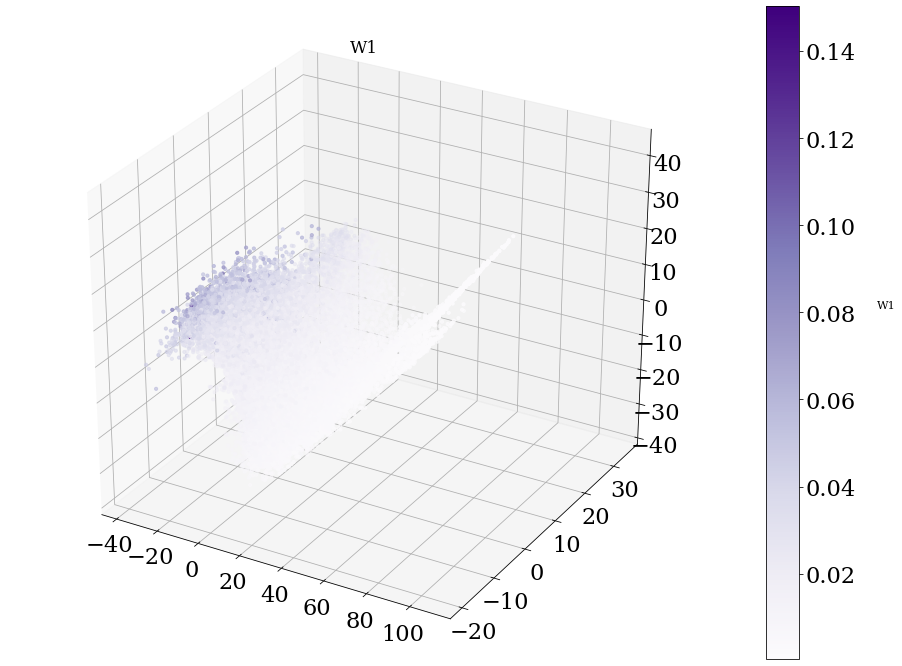

In [8]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_1, cmap="Purples", s=10.0)
ax.set_title("W1", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W1", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_1)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_1)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_1)[0])

-0.7645499754115812
0.12431535998581443
0.5787487073336891


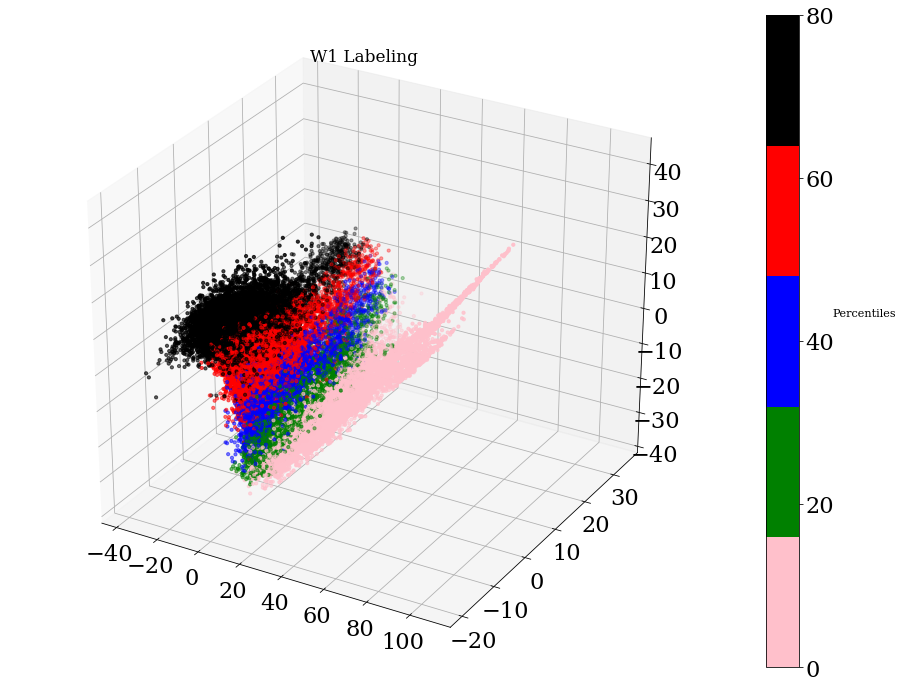

In [9]:
quintiles = np.percentile(W_1, [20,40,60,80])
out = np.searchsorted(quintiles,W_1)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W1 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6705662490108522
0.028136561990164958
0.6519462150485922


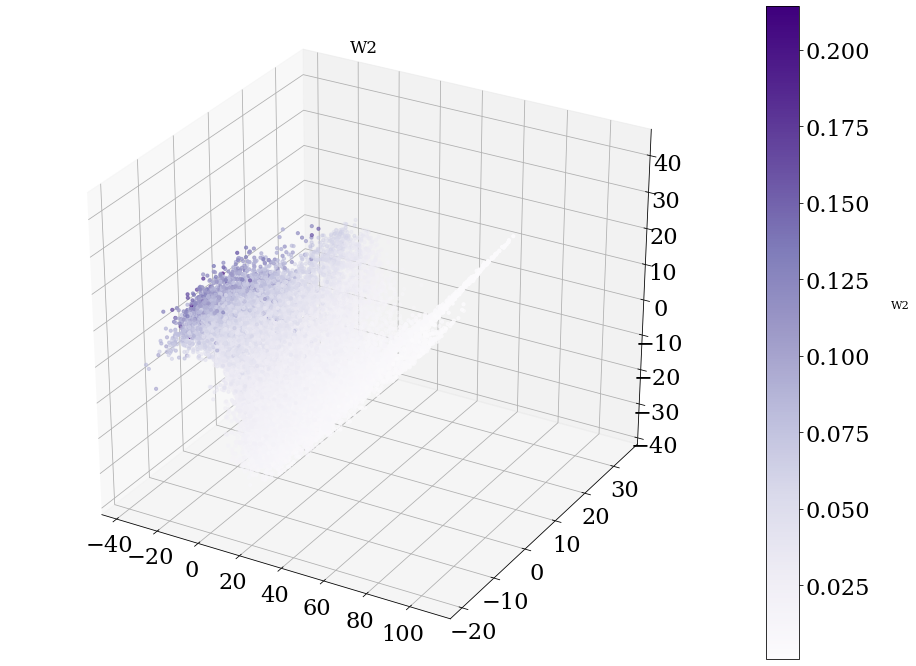

In [10]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_2, cmap="Purples", s=10.0)
ax.set_title("W2", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W2", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_2)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_2)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_2)[0])

-0.7586796532581669
0.11035251417920039
0.5928336219269362


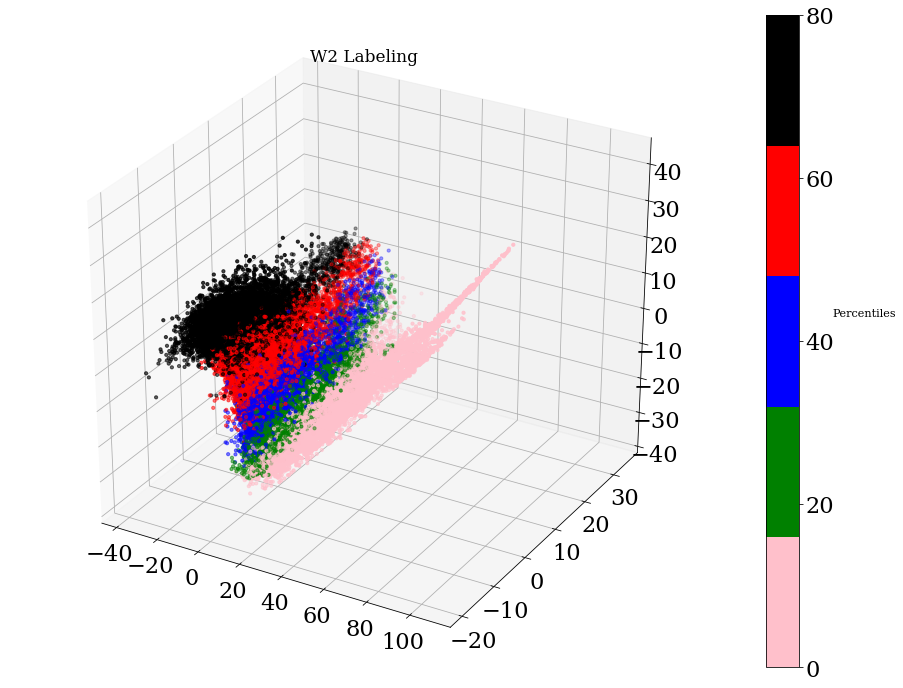

In [11]:
quintiles = np.percentile(W_2, [20,40,60,80])
out = np.searchsorted(quintiles,W_2)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W2 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6696179740891931
0.003931603444508717
0.6649345422702401


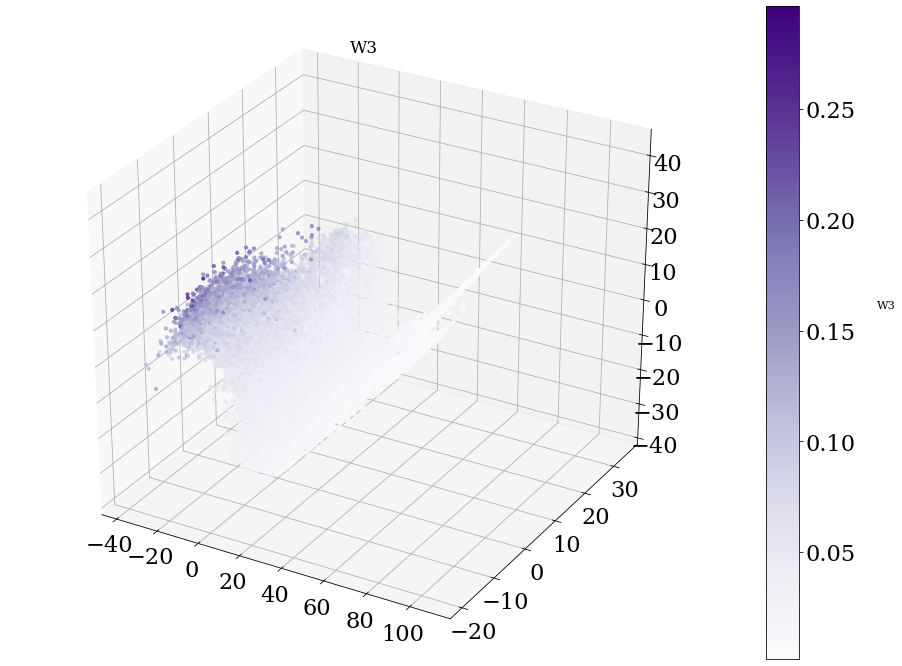

In [12]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_3, cmap="Purples", s=10.0)
ax.set_title("W3", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W3", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_3)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_3)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_3)[0])

-0.7489188787819061
0.08954089003865841
0.6082531632953703


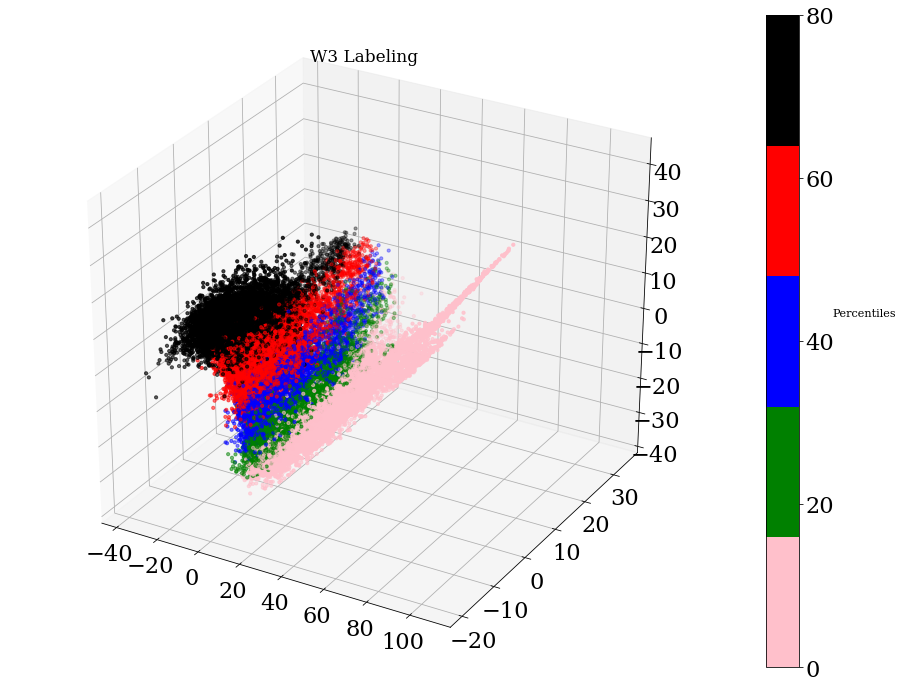

In [13]:
quintiles = np.percentile(W_3, [20,40,60,80])
out = np.searchsorted(quintiles,W_3)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W3 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6688999539818833
-0.029968339509349403
0.674412304769662


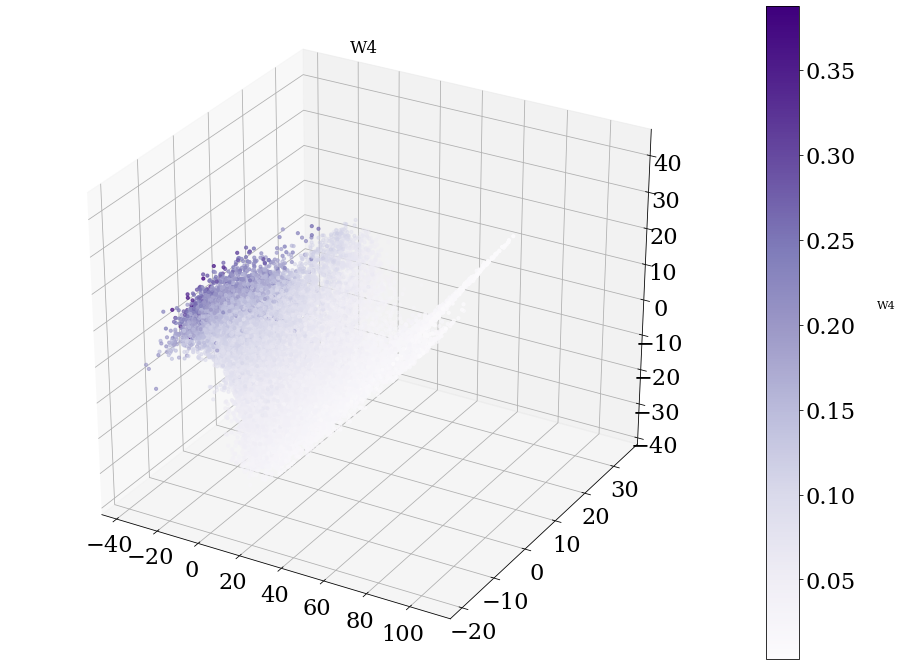

In [14]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_4, cmap="Purples", s=10.0)
ax.set_title("W4", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W4", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_4)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_4)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_4)[0])

-0.7252486358728661
0.04427497846924869
0.620010486765247


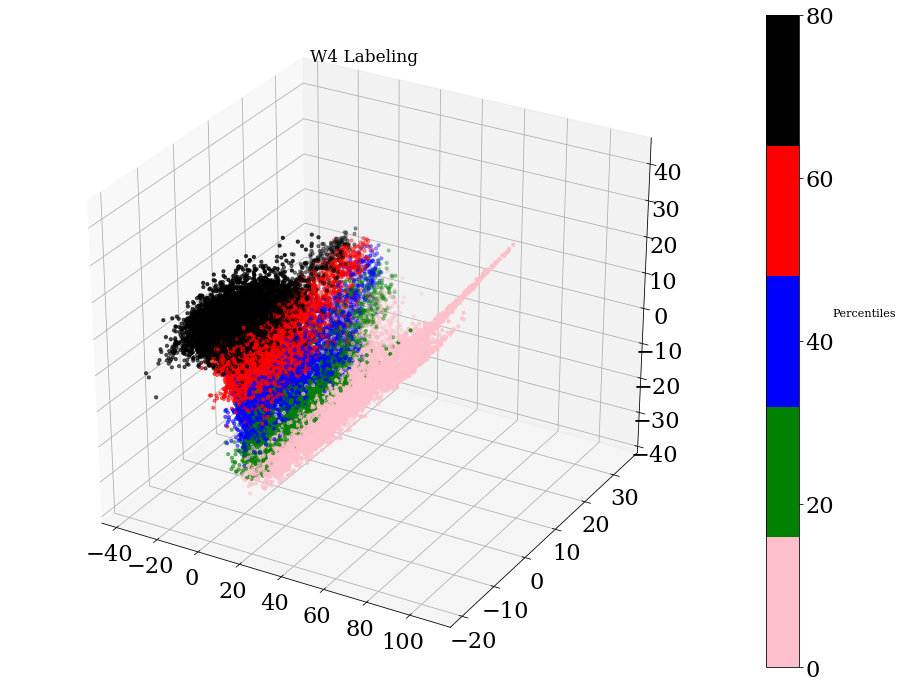

In [15]:
quintiles = np.percentile(W_4, [20,40,60,80])
out = np.searchsorted(quintiles,W_4)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W4 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6765474328377528
-0.01757040965278905
0.6675266066316224


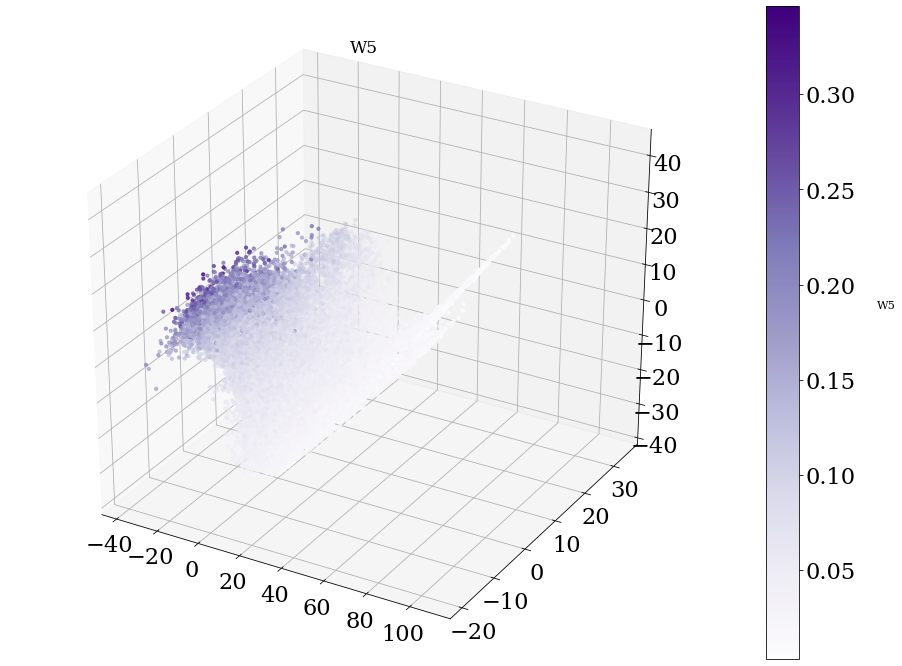

In [16]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_5, cmap="Purples", s=10.0)
ax.set_title("W5", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W5", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_5)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_5)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_5)[0])

-0.7280070432263961
0.054342948431567235
0.6145537266920189


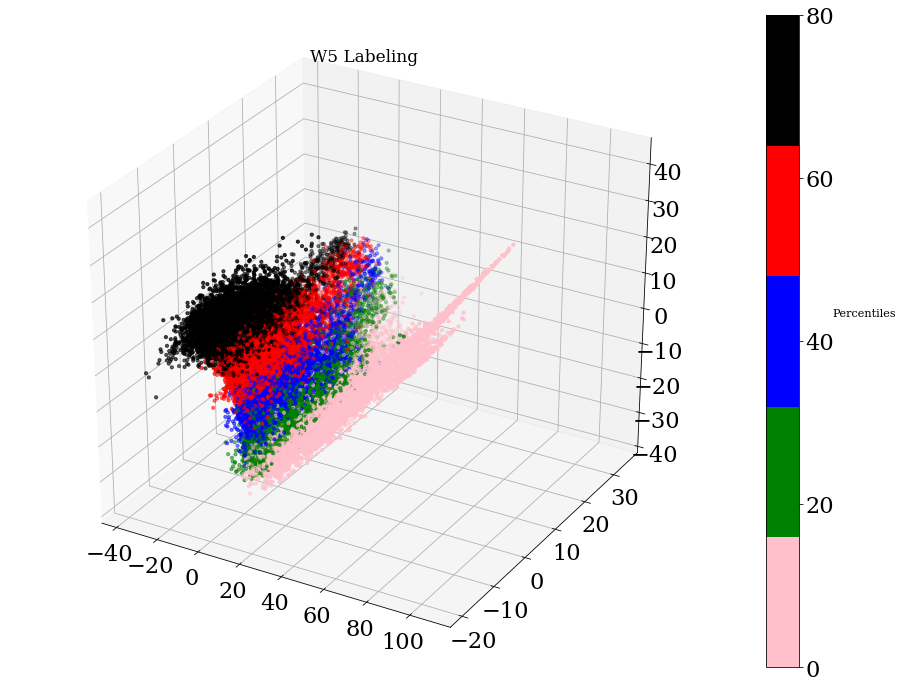

In [17]:
quintiles = np.percentile(W_5, [20,40,60,80])
out = np.searchsorted(quintiles,W_5)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W5 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6941713695323399
0.012558254745428014
0.6499481858923974


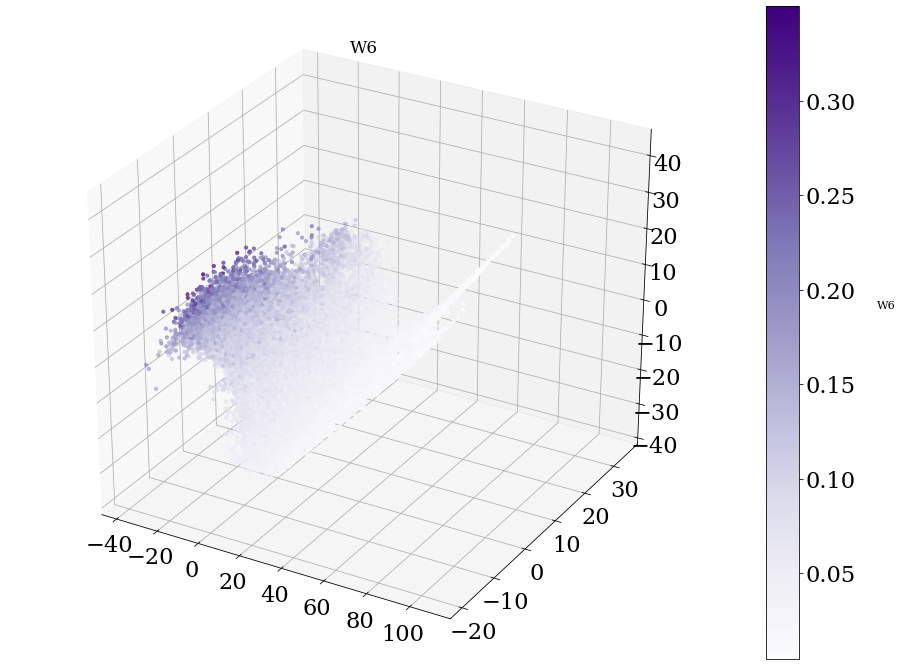

In [18]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_6, cmap="Purples", s=10.0)
ax.set_title("W6", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W6", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_6)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_6)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_6)[0])

-0.7362618460411285
0.07199282574907859
0.6001026895546708


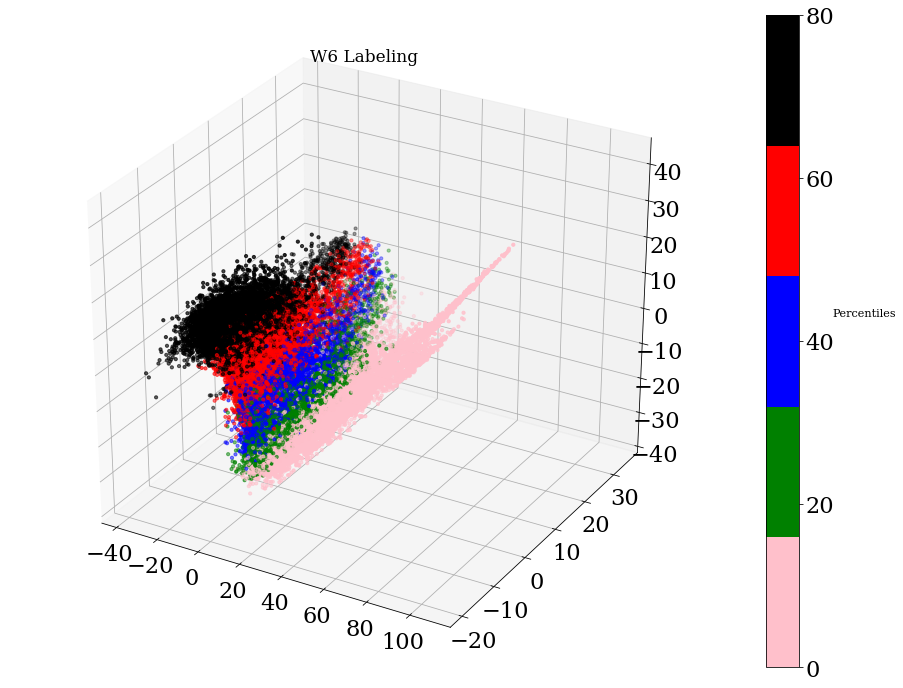

In [19]:
quintiles = np.percentile(W_6, [20,40,60,80])
out = np.searchsorted(quintiles,W_6)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W6 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6786082217059379
0.032431785224593355
0.6505542190868879


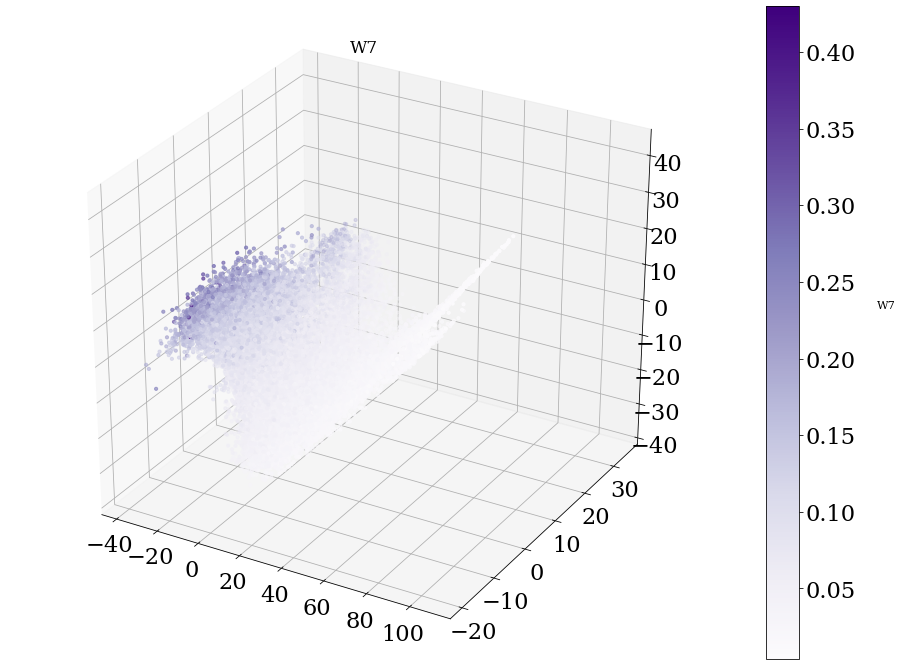

In [20]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_7, cmap="Purples", s=10.0)
ax.set_title("W7", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W7", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_7)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_7)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_7)[0])

-0.7318353428092739
0.09678883424583441
0.6037644008910804


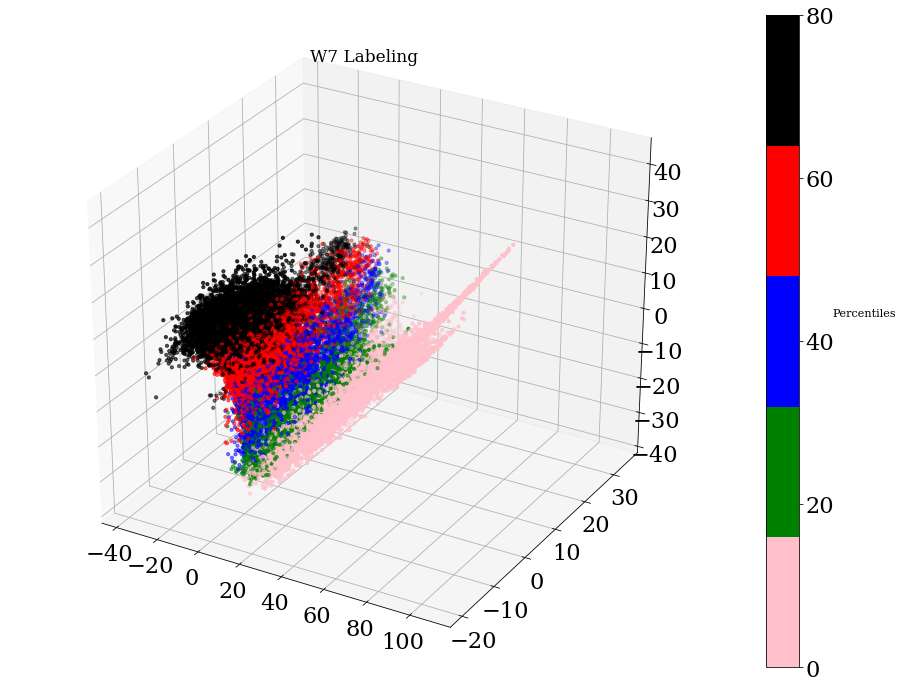

In [21]:
quintiles = np.percentile(W_7, [20,40,60,80])
out = np.searchsorted(quintiles,W_7)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W7 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6766238941171174
0.010271475935802236
0.6330325503660355


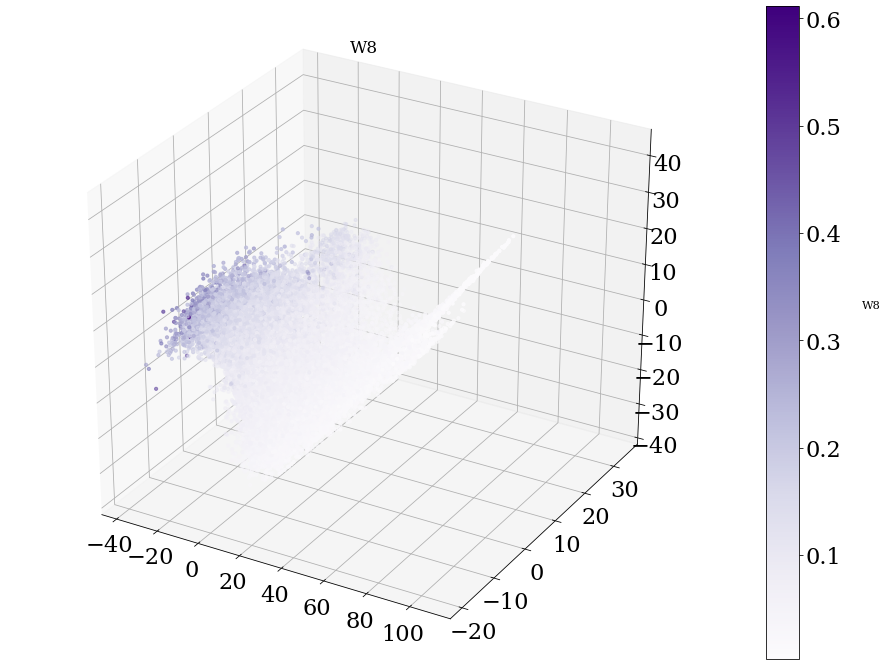

In [22]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_8, cmap="Purples", s=10.0)
ax.set_title("W8", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W8", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_8)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_8)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_8)[0])

-0.7211654927790409
0.07059945301177957
0.6034644810065851


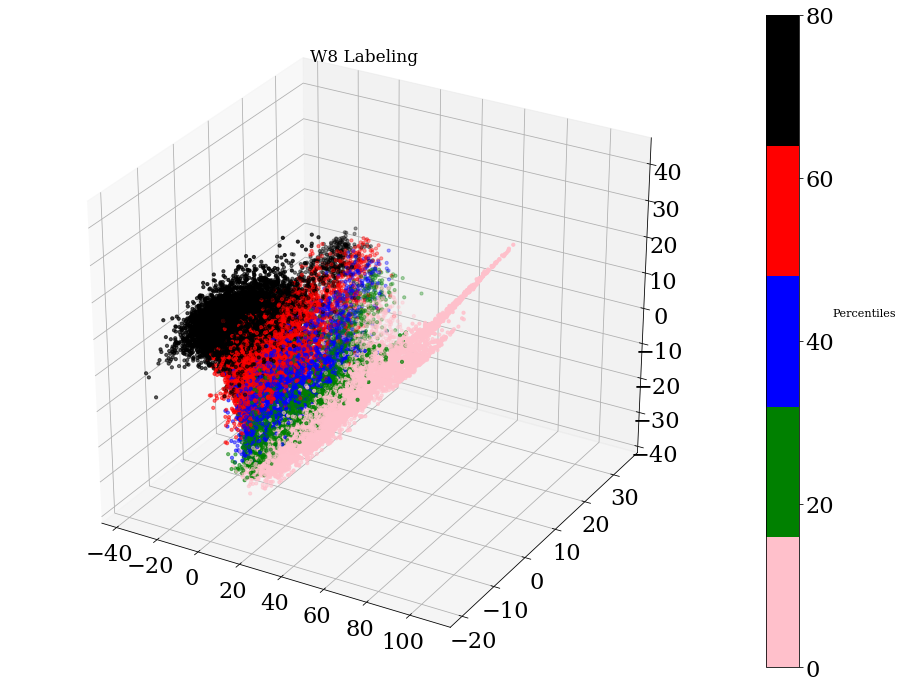

In [23]:
quintiles = np.percentile(W_8, [20,40,60,80])
out = np.searchsorted(quintiles,W_8)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W8 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6506091485214118
-0.01163306854599658
0.5793575339539752


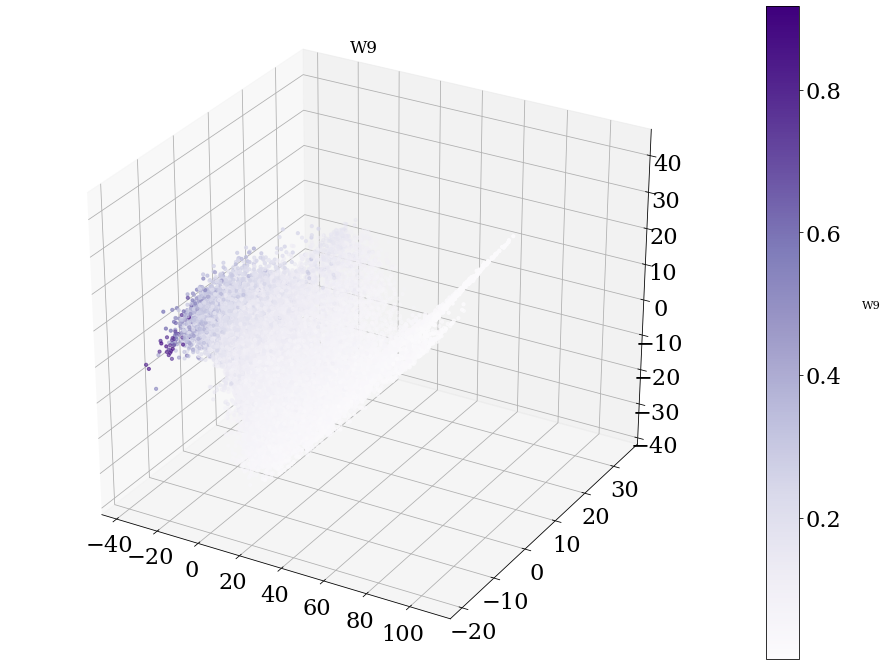

In [24]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_9, cmap="Purples", s=10.0)
ax.set_title("W9", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W9", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_9)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_9)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_9)[0])

-0.7173166650124155
0.08866787677130827
0.5915482363812284


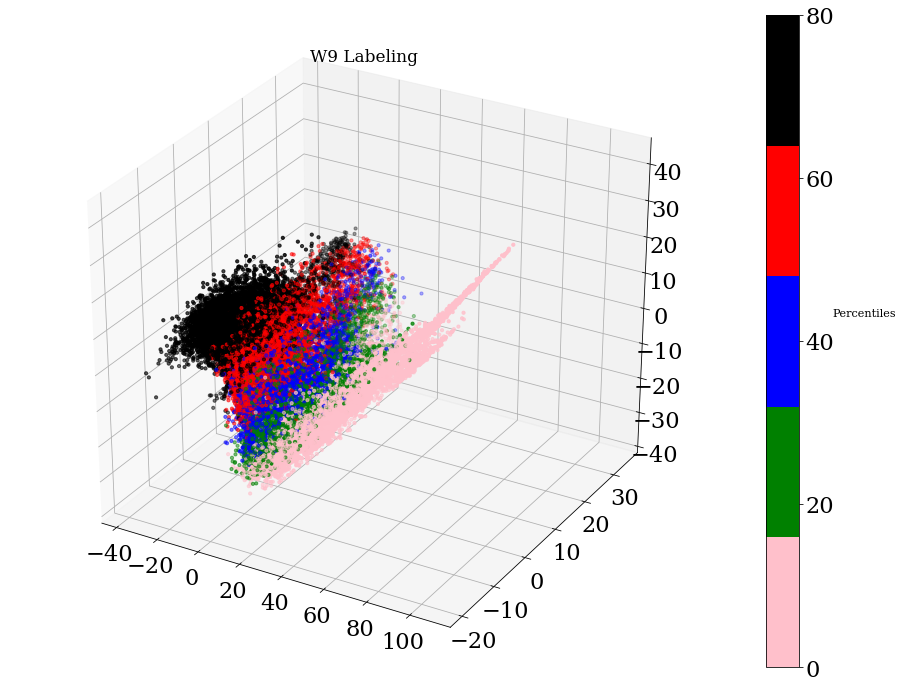

In [25]:
quintiles = np.percentile(W_9, [20,40,60,80])
out = np.searchsorted(quintiles,W_9)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W9 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6379771563098879
-0.00834128169800588
0.5665675671736727


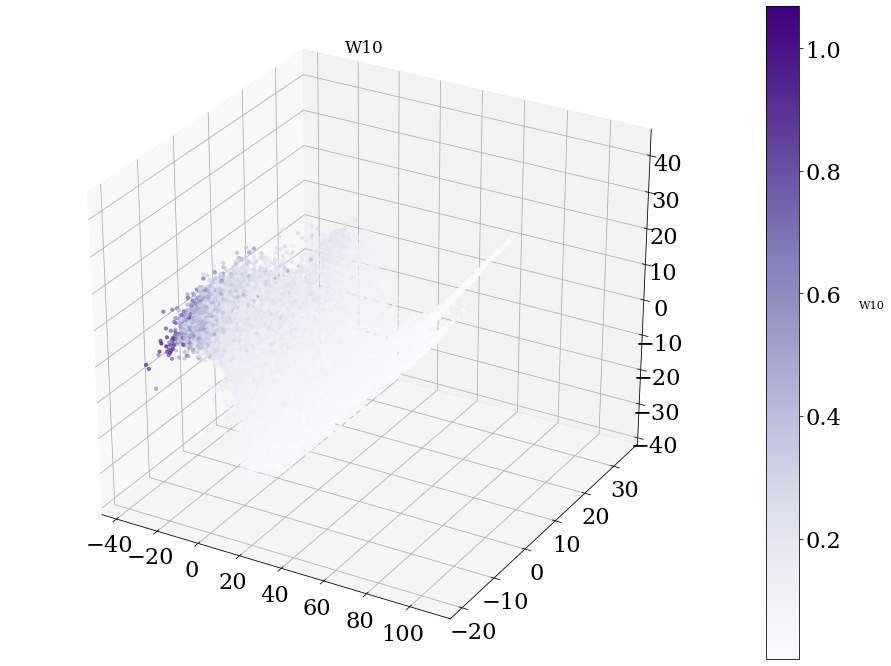

In [26]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_10, cmap="Purples", s=10.0)
ax.set_title("W10", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W10", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_10)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_10)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_10)[0])

-0.7075493282923029
0.09096480502752619
0.5989026506753273


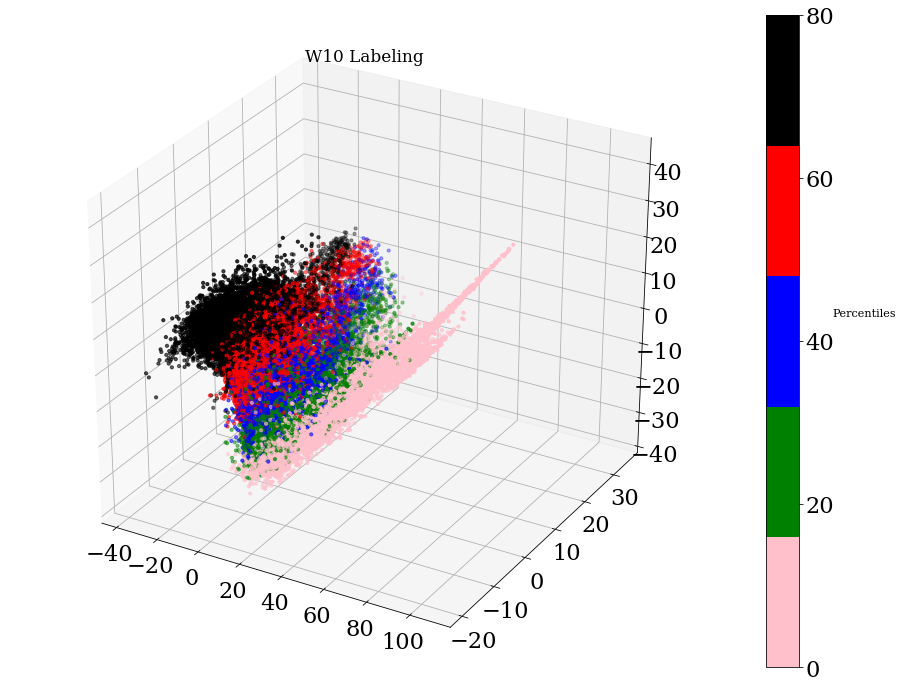

In [27]:
quintiles = np.percentile(W_10, [20,40,60,80])
out = np.searchsorted(quintiles,W_10)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W10 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6512041481662573
0.0030478872603315983
0.5671098742773449


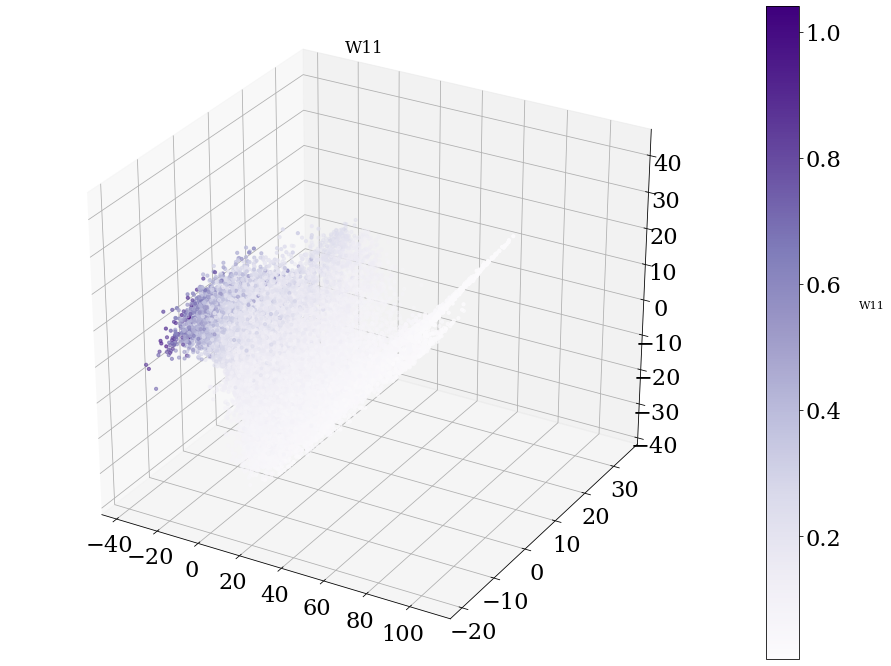

In [28]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_11, cmap="Purples", s=10.0)
ax.set_title("W11", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W11", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_11)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_11)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_11)[0])

-0.7290752227055116
0.11193356408698162
0.586879525405895


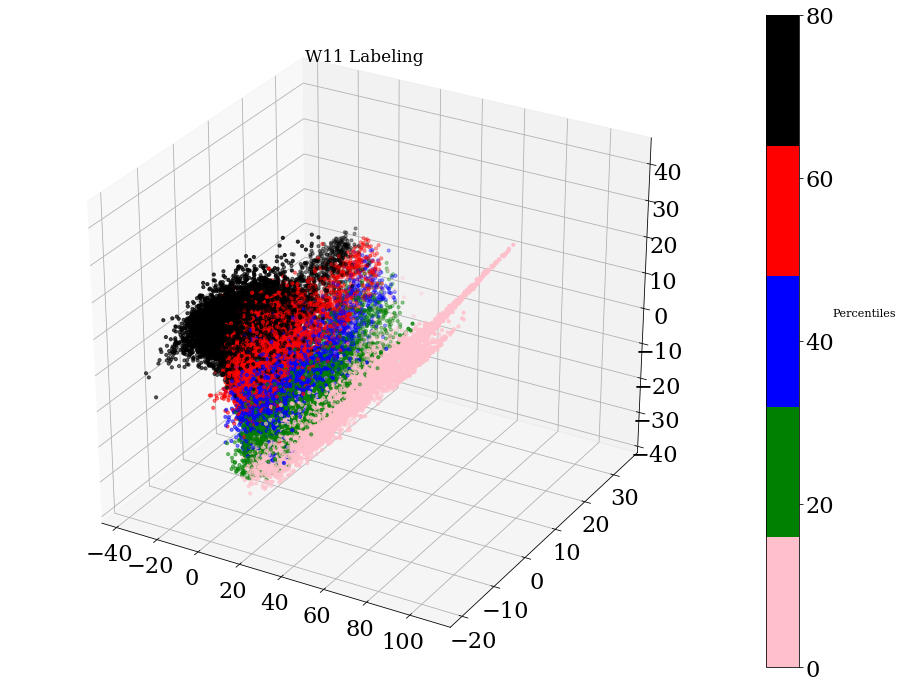

In [29]:
quintiles = np.percentile(W_11, [20,40,60,80])
out = np.searchsorted(quintiles,W_11)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W11 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6725576096925845
0.03173900070784058
0.5716693587269037


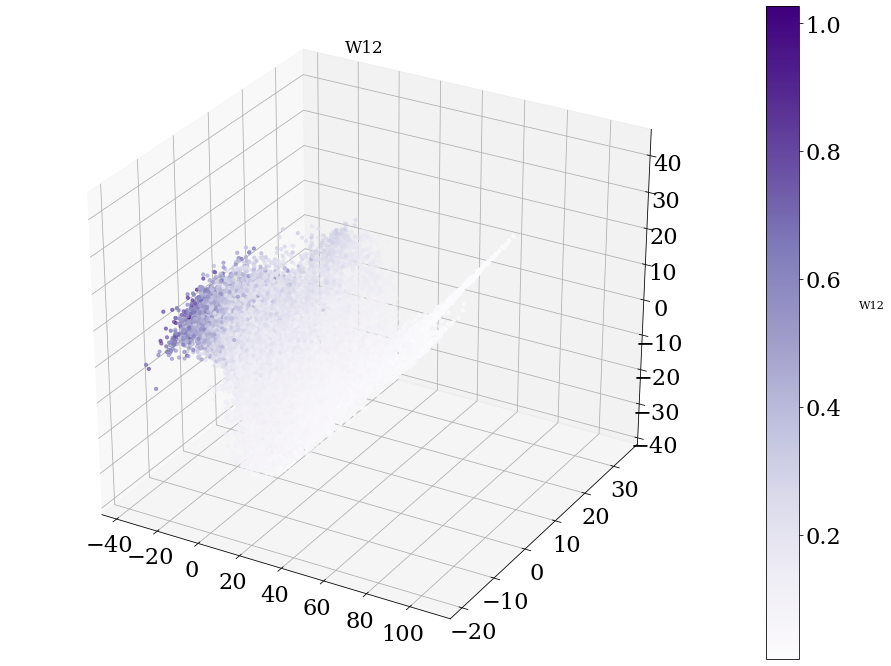

In [30]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_12, cmap="Purples", s=10.0)
ax.set_title("W12", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W12", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_12)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_12)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_12)[0])

-0.7575980562325398
0.1488335445891007
0.560298645843873


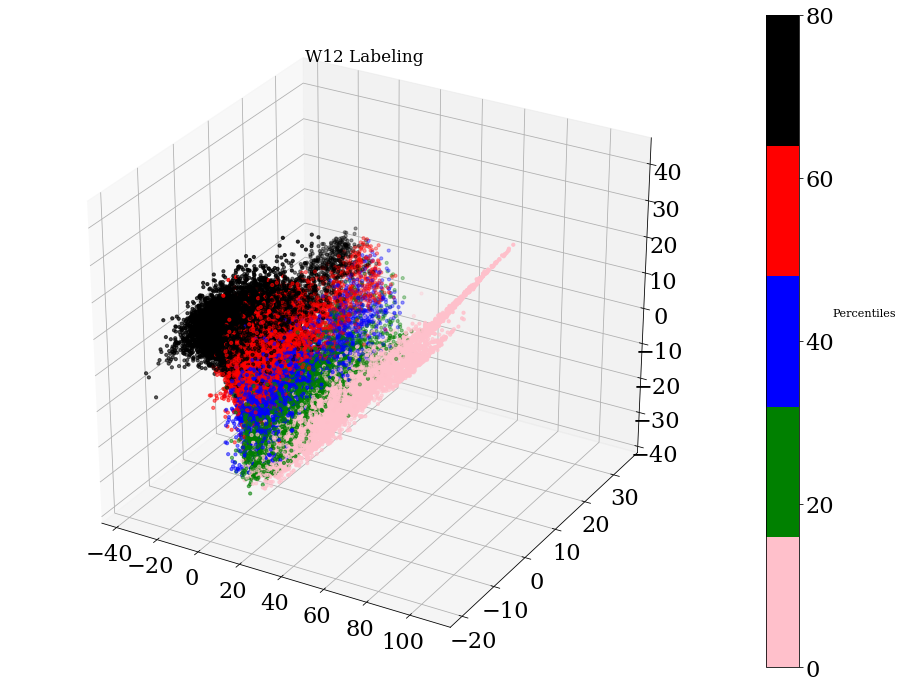

In [31]:
quintiles = np.percentile(W_12, [20,40,60,80])
out = np.searchsorted(quintiles,W_12)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W12 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.685690423333439
0.12345270461272226
0.573698565510709


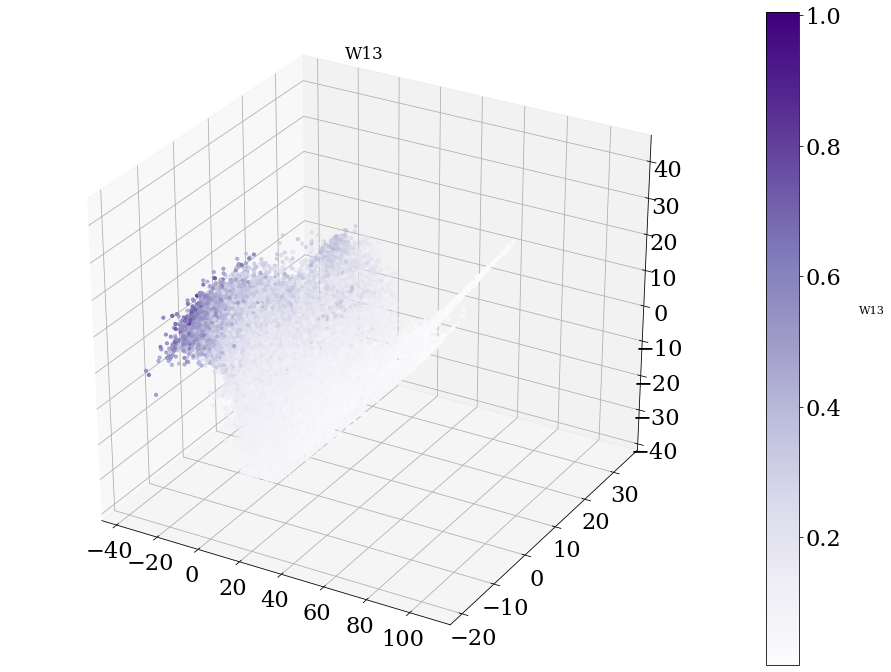

In [32]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_13, cmap="Purples", s=10.0)
ax.set_title("W13", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W13", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_13)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_13)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_13)[0])

-0.7716384685294395
0.24596728897264314
0.5398711504133442


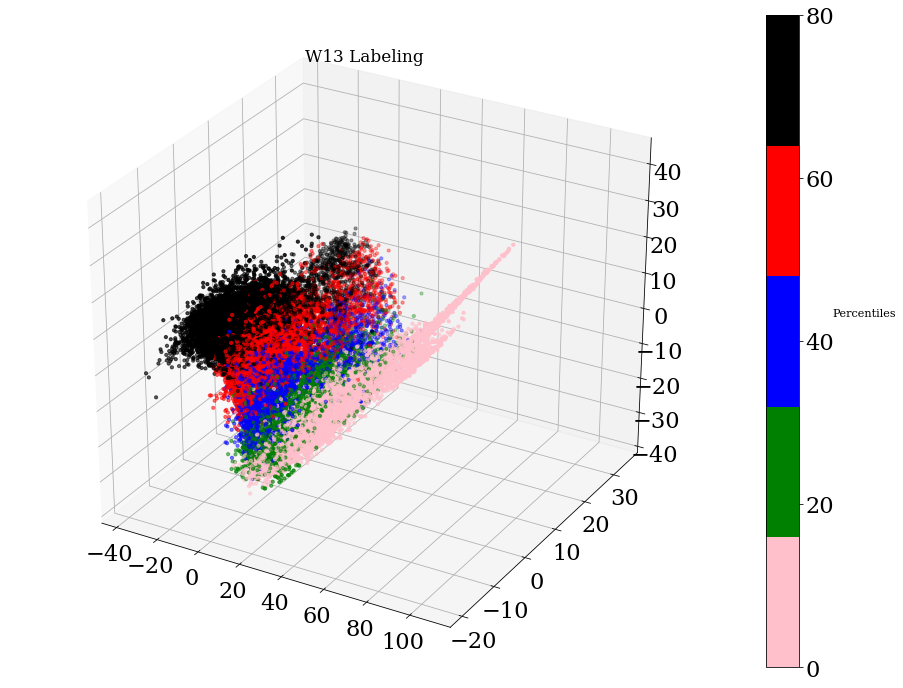

In [33]:
quintiles = np.percentile(W_13, [20,40,60,80])
out = np.searchsorted(quintiles,W_13)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W13 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6723320400366865
0.1576535034352476
0.5770777322640352


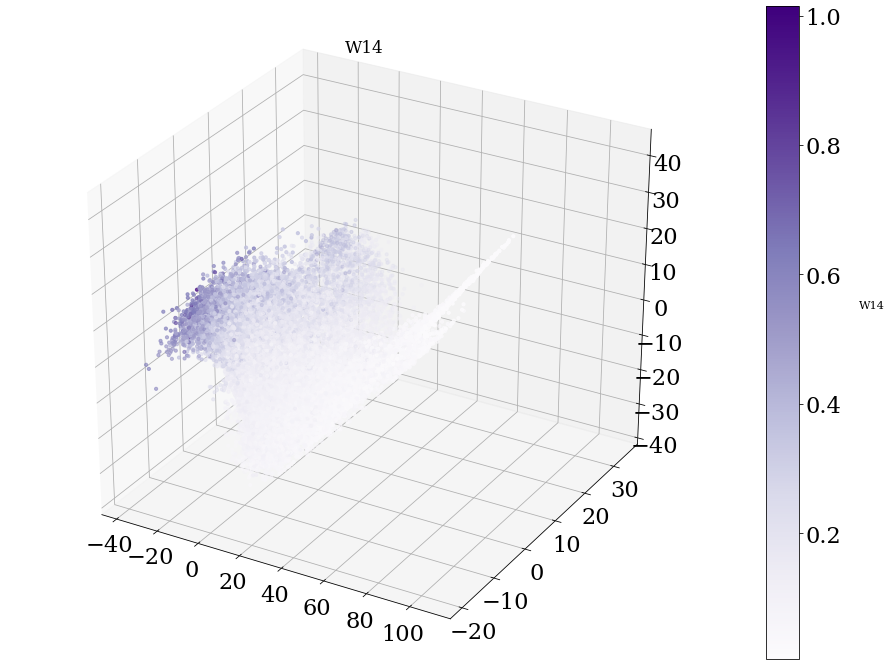

In [34]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_14, cmap="Purples", s=10.0)
ax.set_title("W14", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W14", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_14)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_14)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_14)[0])

-0.7550028602881418
0.2822232069331368
0.5229008751711574


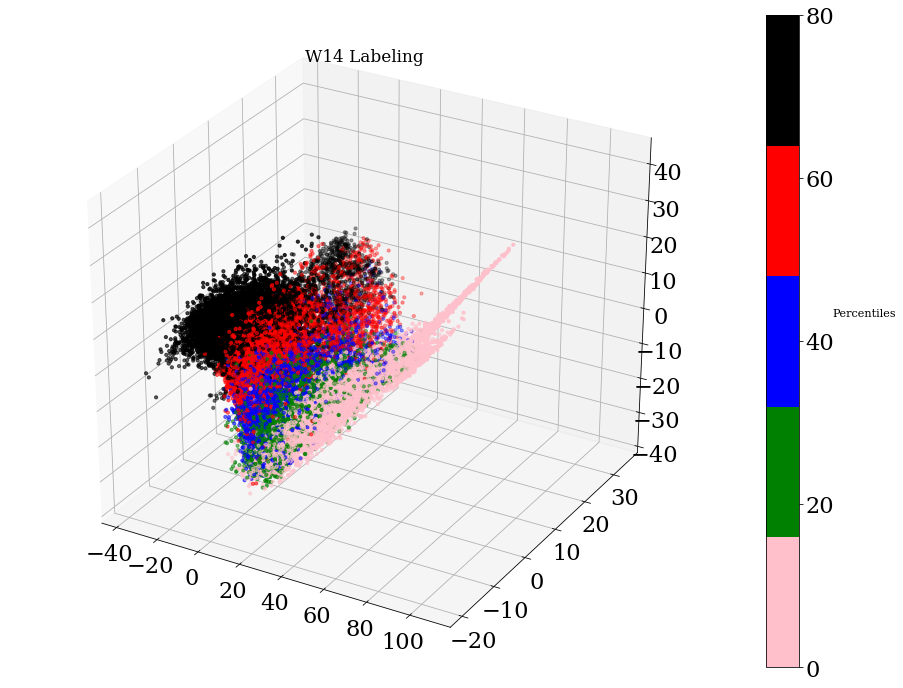

In [35]:
quintiles = np.percentile(W_14, [20,40,60,80])
out = np.searchsorted(quintiles,W_14)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W14 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6539391191534852
0.14541886121830924
0.5785917545106699


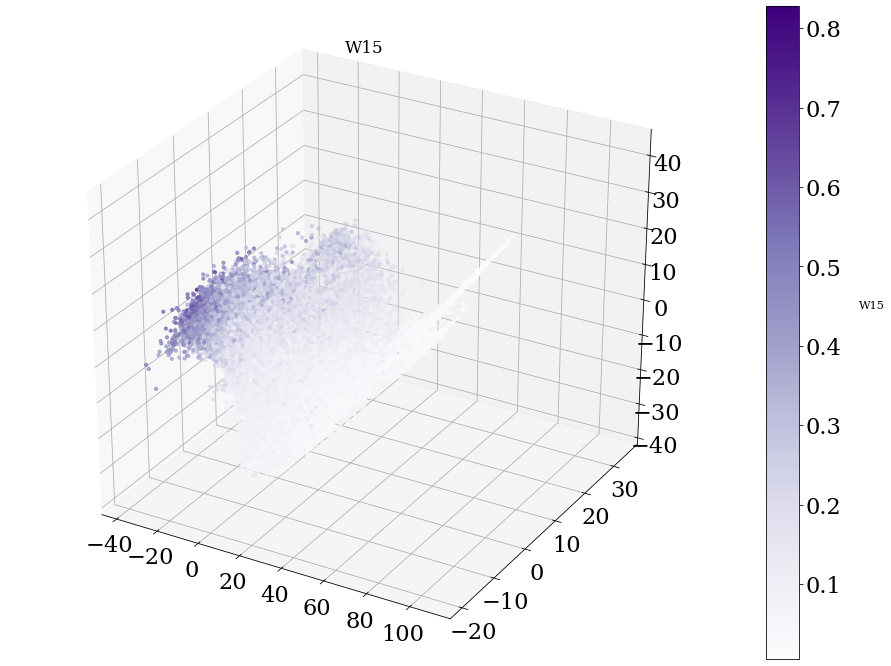

In [36]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_15, cmap="Purples", s=10.0)
ax.set_title("W15", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W15", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_15)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_15)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_15)[0])

-0.7321251833780206
0.27774023642891416
0.5261791205617565


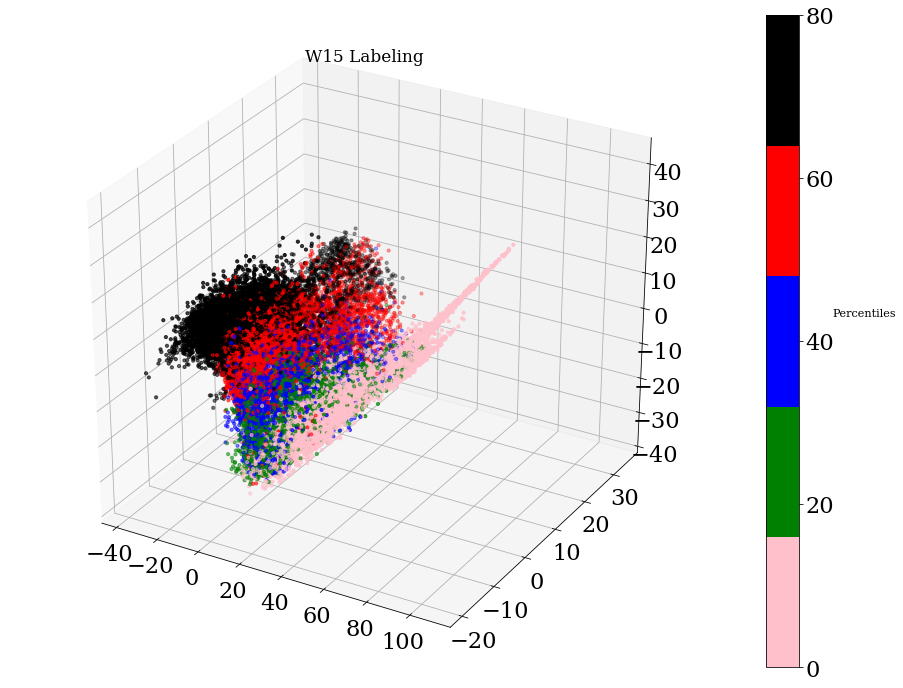

In [37]:
quintiles = np.percentile(W_15, [20,40,60,80])
out = np.searchsorted(quintiles,W_15)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W15 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.656037037412742
0.15187345923373566
0.5763274982379466


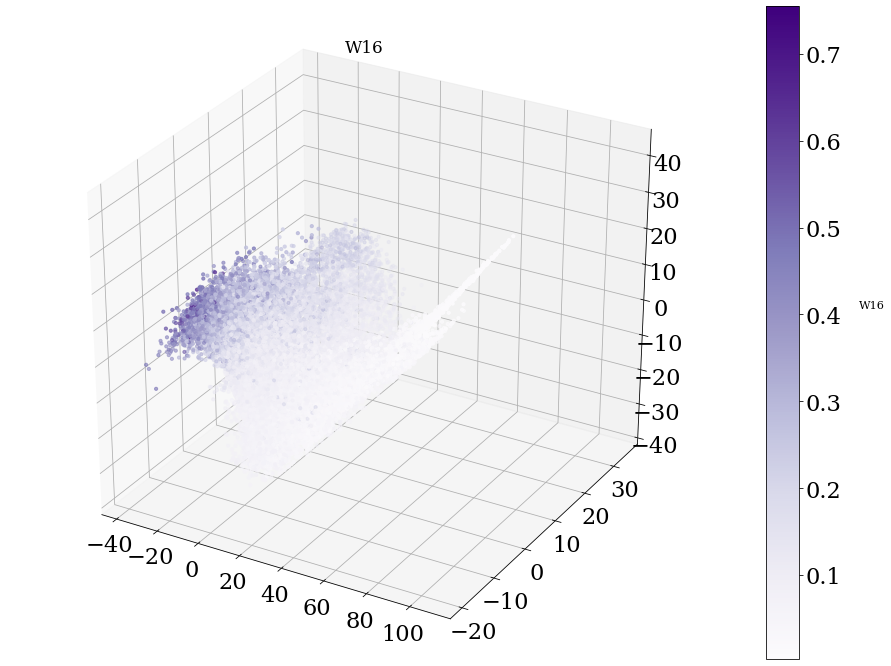

In [38]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_16, cmap="Purples", s=10.0)
ax.set_title("W16", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W16", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_16)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_16)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_16)[0])

-0.7485277205979349
0.3083798544147563
0.5177799979967452


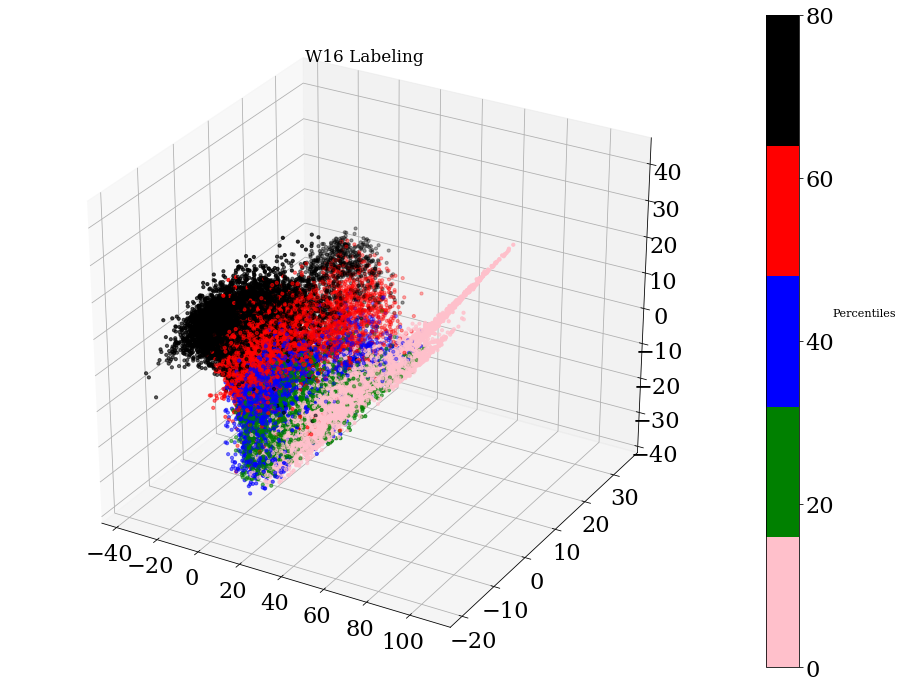

In [39]:
quintiles = np.percentile(W_16, [20,40,60,80])
out = np.searchsorted(quintiles,W_16)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W16 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.65338008026337
0.17037972459884124
0.5789069537555369


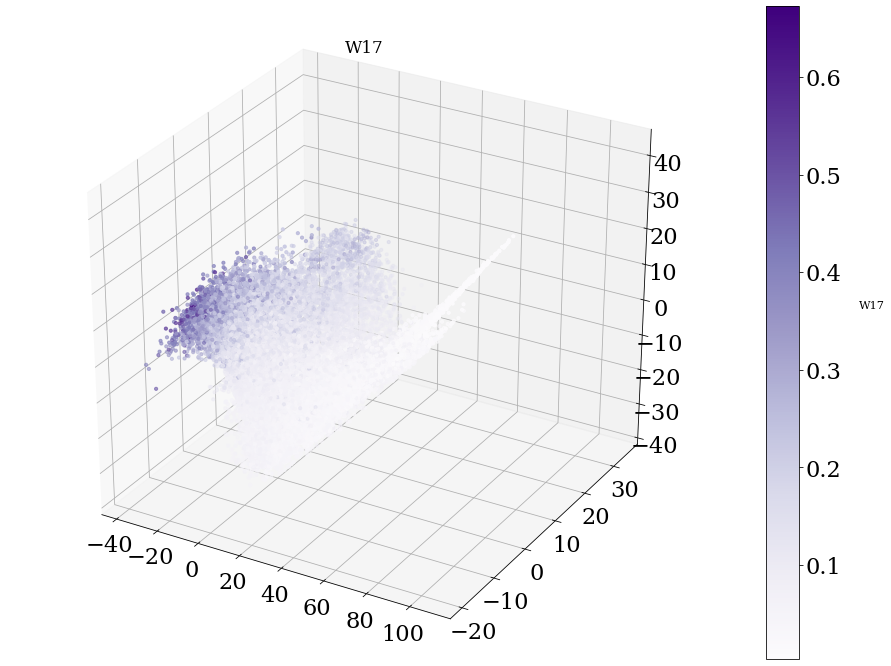

In [40]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_17, cmap="Purples", s=10.0)
ax.set_title("W17", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W17", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_17)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_17)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_17)[0])

-0.7531726094012285
0.3383806989486071
0.513797904281356


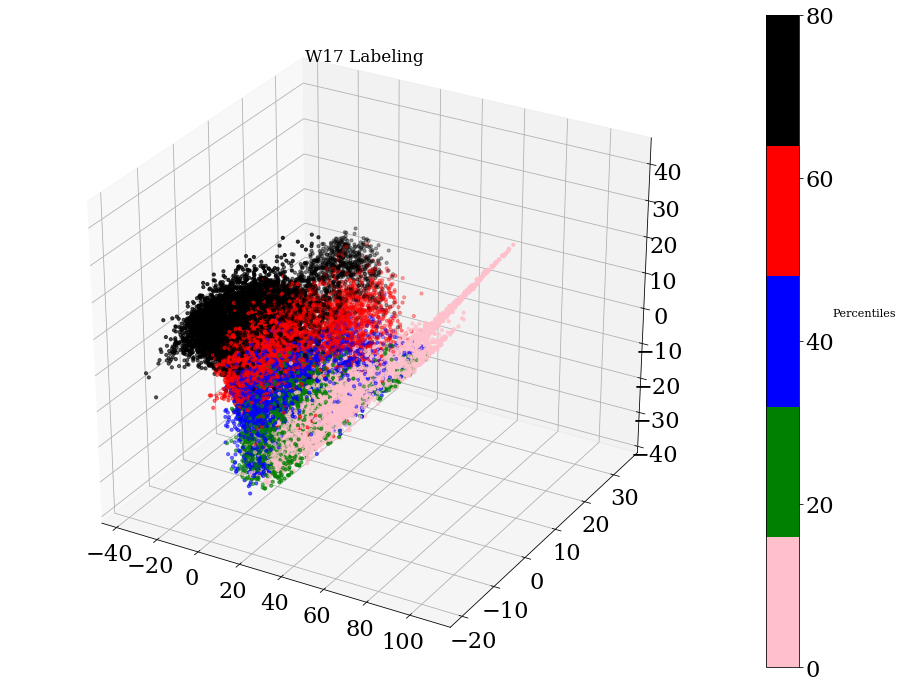

In [41]:
quintiles = np.percentile(W_17, [20,40,60,80])
out = np.searchsorted(quintiles,W_17)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W17 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6449968301017688
0.16573784214295745
0.5742468644453169


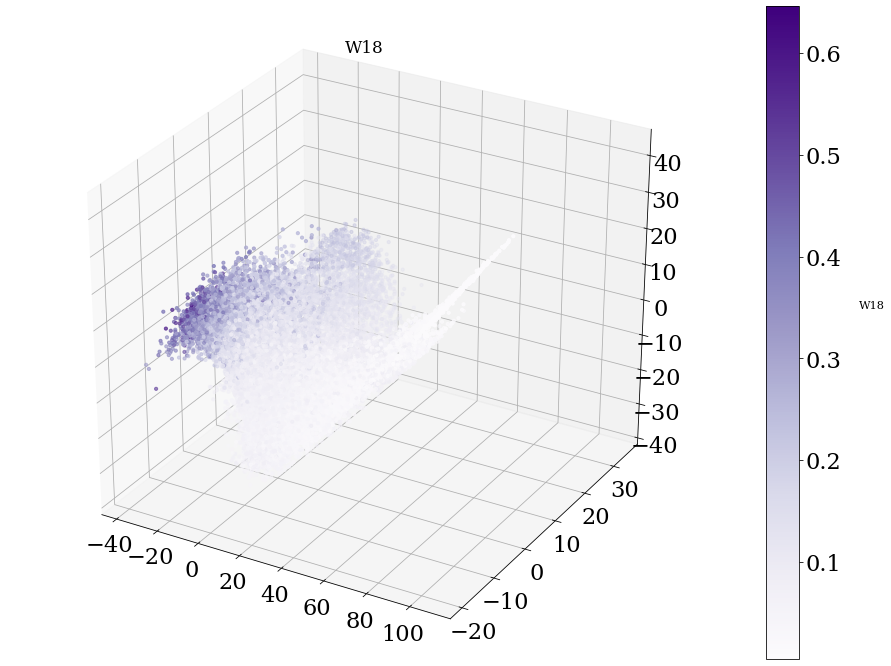

In [42]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_18, cmap="Purples", s=10.0)
ax.set_title("W18", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W18", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_18)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_18)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_18)[0])

-0.7323102808811858
0.3404664898708664
0.5110504434590977


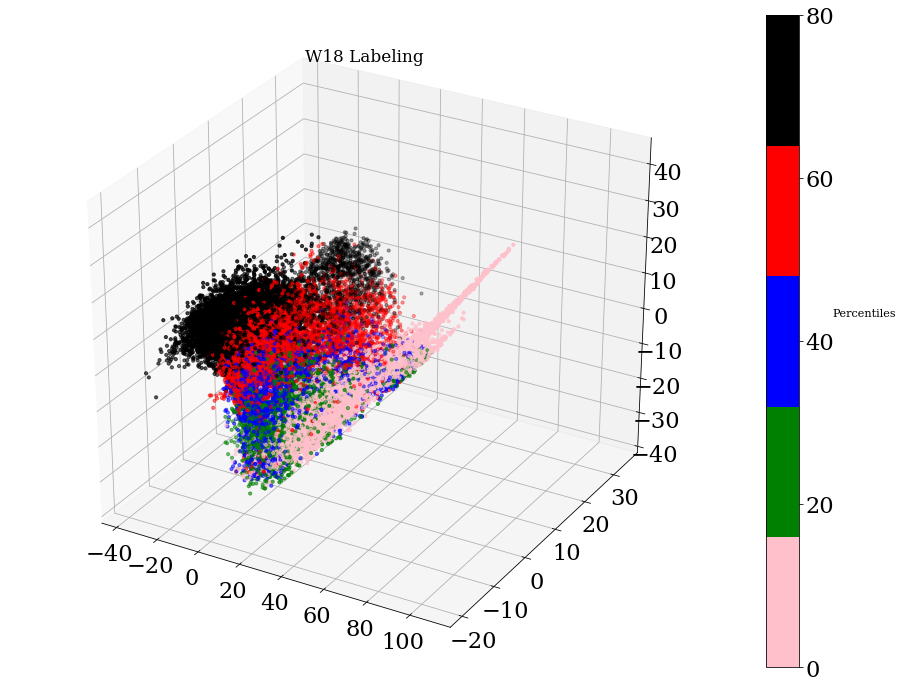

In [43]:
quintiles = np.percentile(W_18, [20,40,60,80])
out = np.searchsorted(quintiles,W_18)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W18 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.6441603632657125
0.17114050506325085
0.5618877234946895


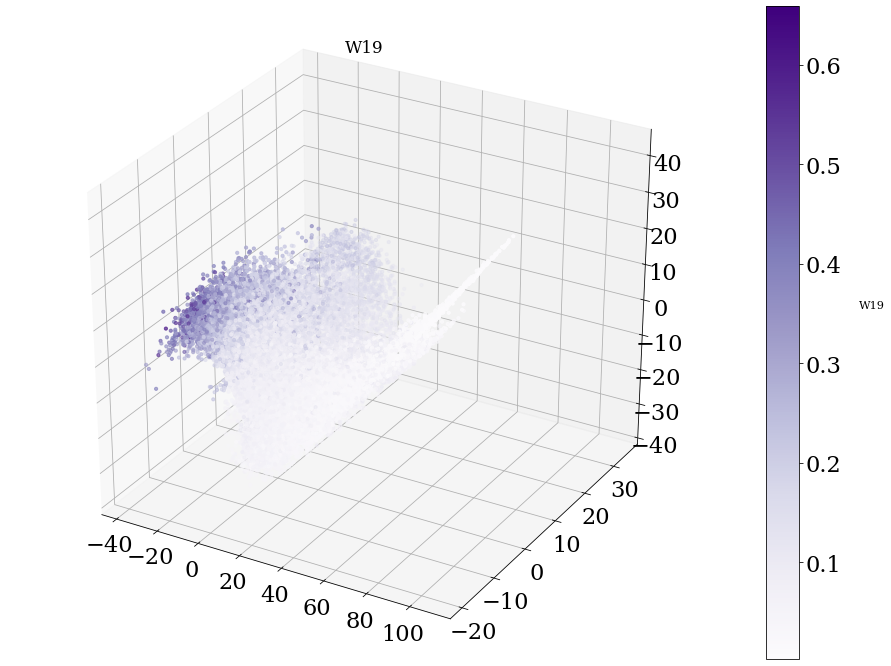

In [44]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_19, cmap="Purples", s=10.0)
ax.set_title("W19", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W19", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_19)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_19)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_19)[0])

-0.7323621457079879
0.346666257004124
0.4913019801485168


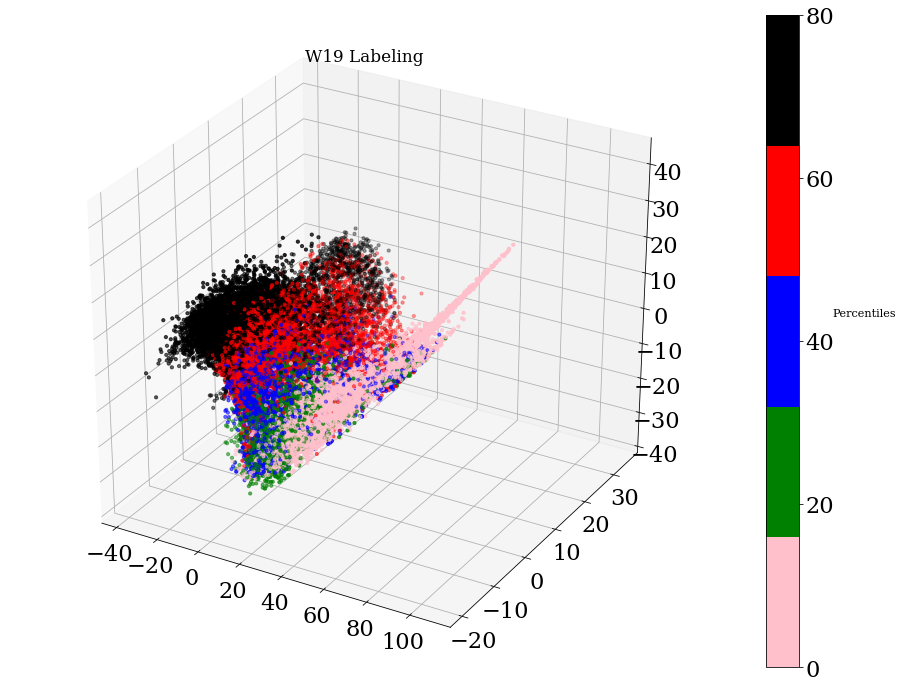

In [45]:
quintiles = np.percentile(W_19, [20,40,60,80])
out = np.searchsorted(quintiles,W_19)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W19 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.63929203152317
0.21739471412434008
0.5491225331920614


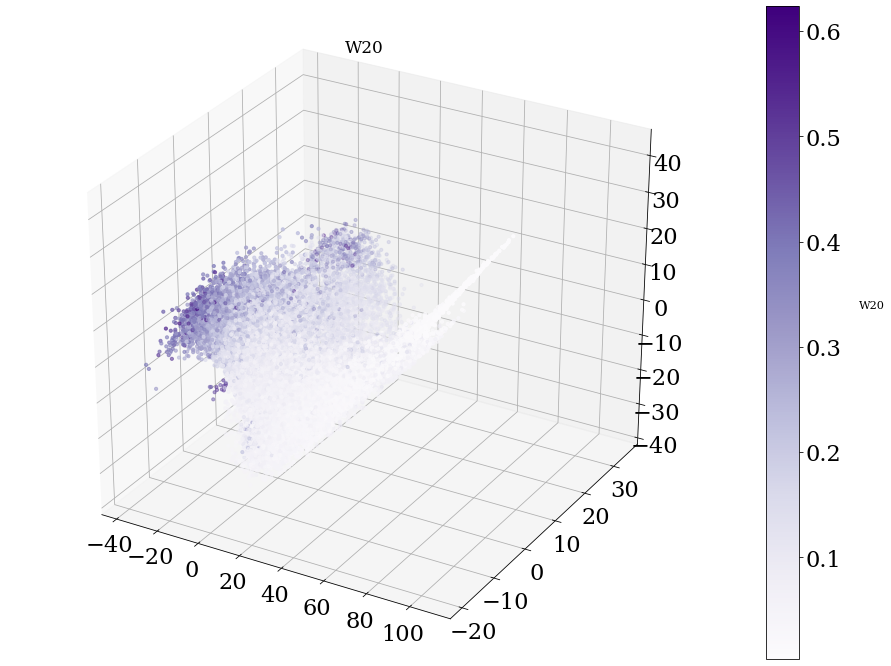

In [46]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_20, cmap="Purples", s=10.0)
ax.set_title("W20", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W20", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_20)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_20)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_20)[0])

-0.7231912637944518
0.34742840737199965
0.47756299493711196


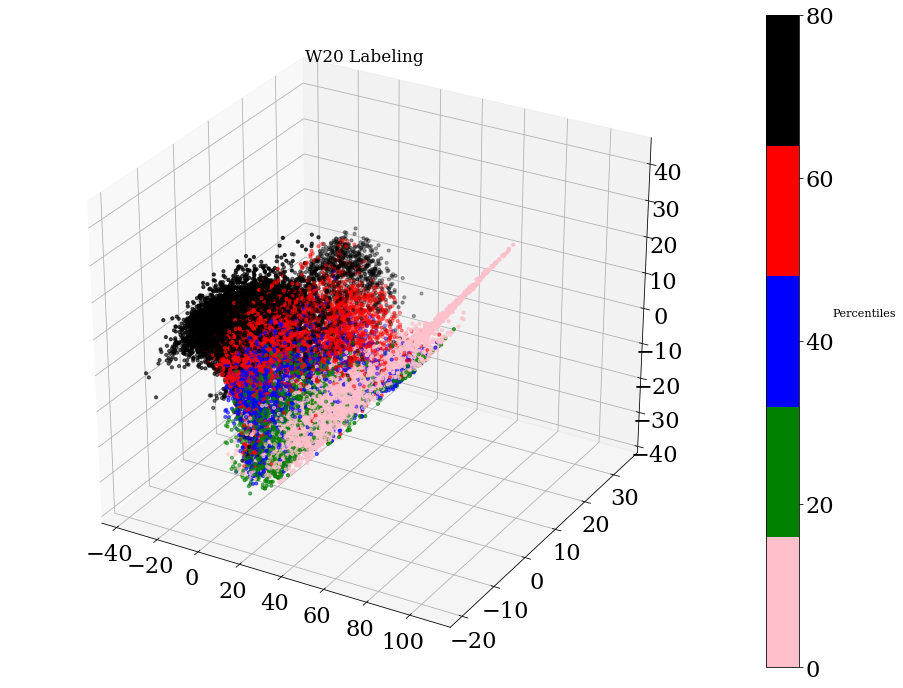

In [47]:
quintiles = np.percentile(W_20, [20,40,60,80])
out = np.searchsorted(quintiles,W_20)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W20 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.5641577906884273
0.40092295755633045
0.5091122830606697


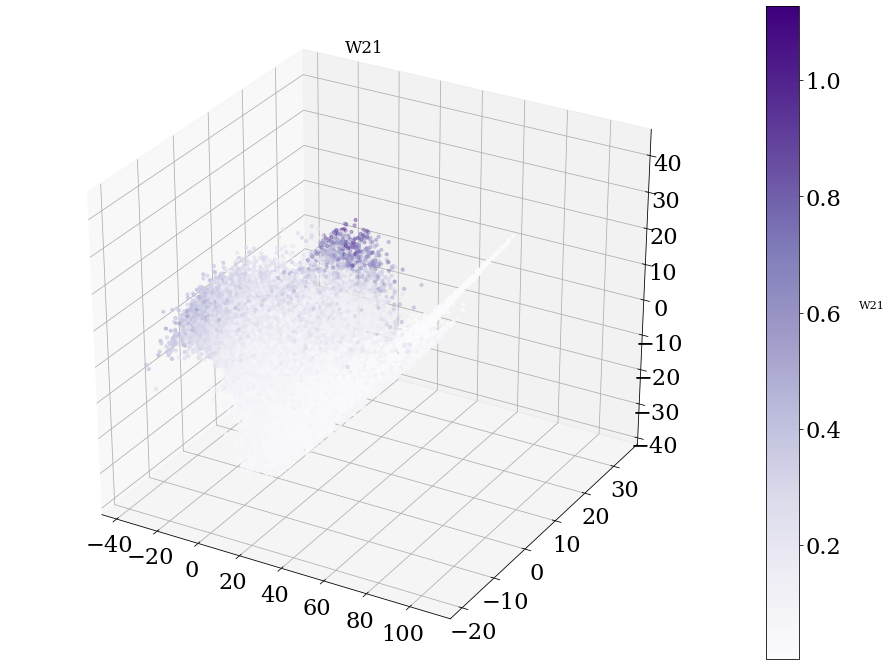

In [48]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_21, cmap="Purples", s=10.0)
ax.set_title("W21", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W21", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_21)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_21)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_21)[0])

-0.7044328013935979
0.38613918481509774
0.48315932406910267


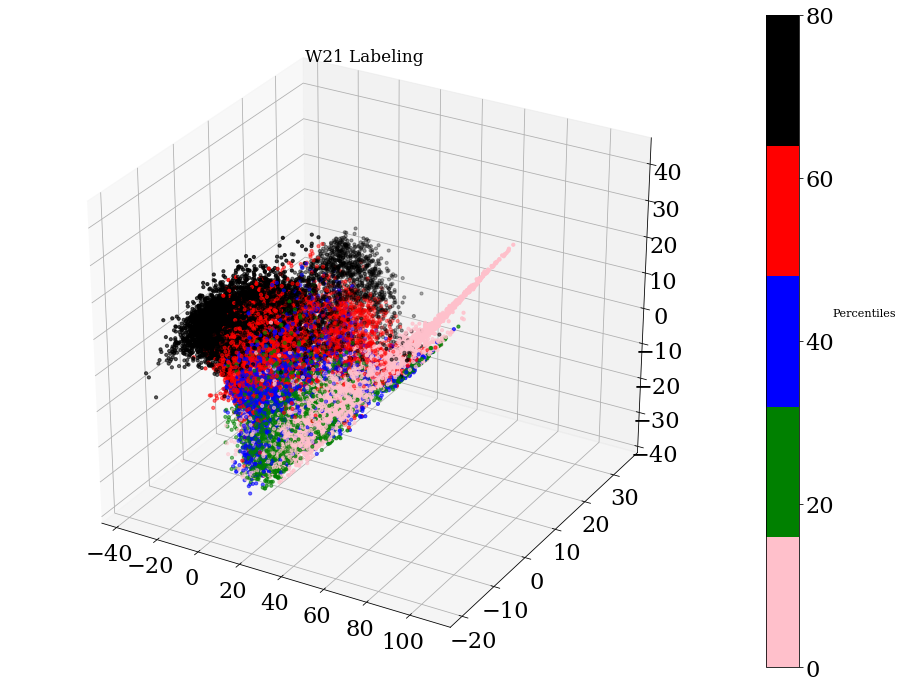

In [49]:
quintiles = np.percentile(W_21, [20,40,60,80])
out = np.searchsorted(quintiles,W_21)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W21 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.46644443876012953
0.5901486377388429
0.41273788445255016


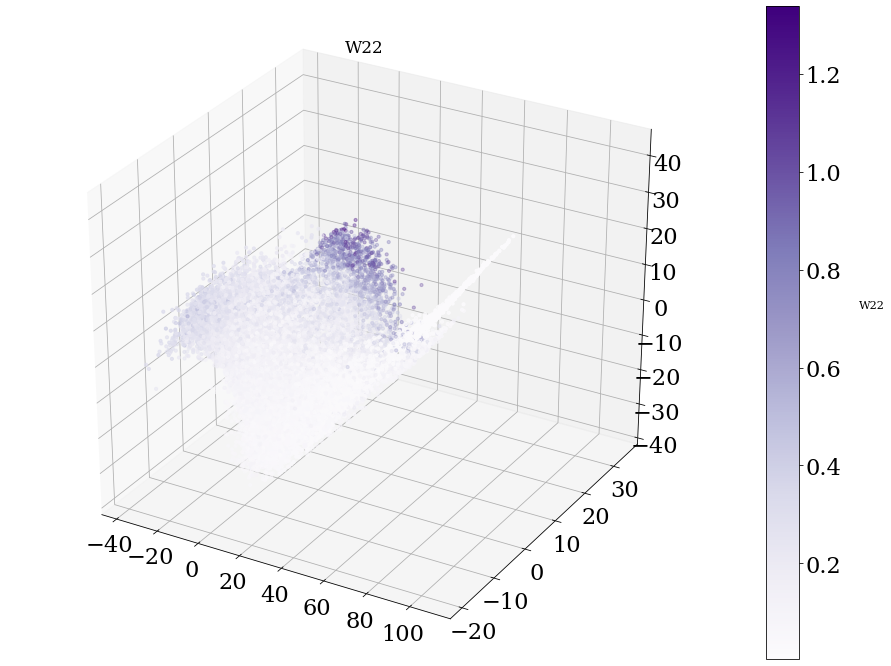

In [50]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_22, cmap="Purples", s=10.0)
ax.set_title("W22", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W22", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_22)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_22)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_22)[0])

-0.6805473873920749
0.4536598883518511
0.4679377058063894


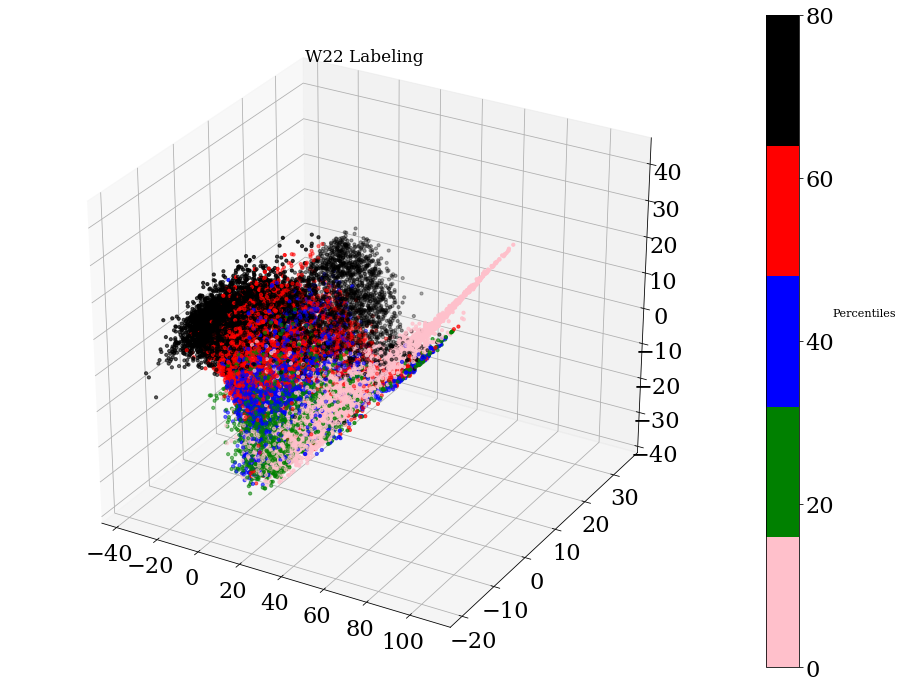

In [51]:
quintiles = np.percentile(W_22, [20,40,60,80])
out = np.searchsorted(quintiles,W_22)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W22 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.4062175314411103
0.7255058026704909
0.3312945199502142


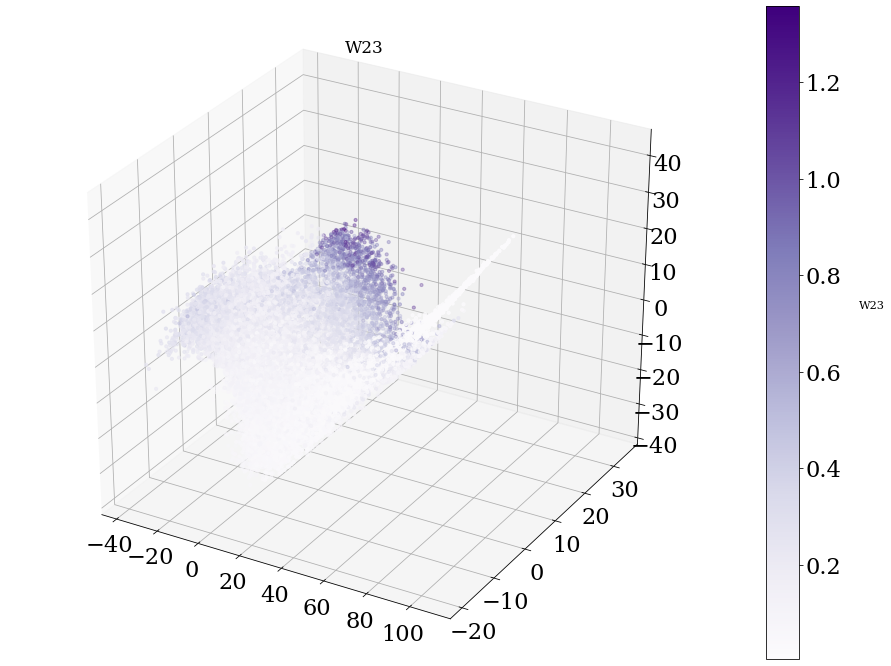

In [52]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_23, cmap="Purples", s=10.0)
ax.set_title("W23", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W23", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_23)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_23)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_23)[0])

-0.6627357976048319
0.5282621263328294
0.41703504079842846


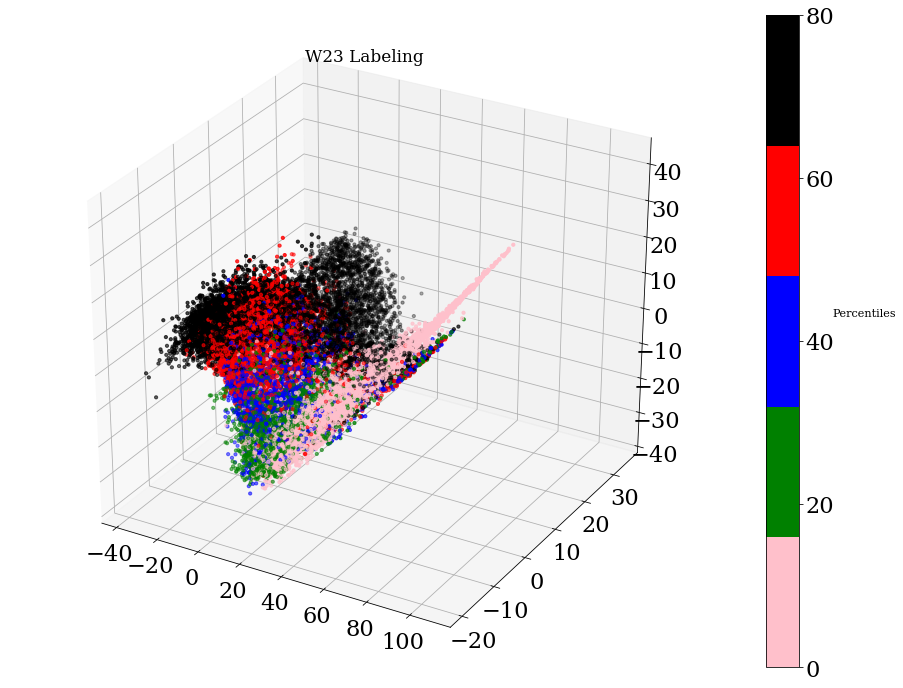

In [53]:
quintiles = np.percentile(W_23, [20,40,60,80])
out = np.searchsorted(quintiles,W_23)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W23 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.33771804459841254
0.8342247837888905
0.23417240550267665


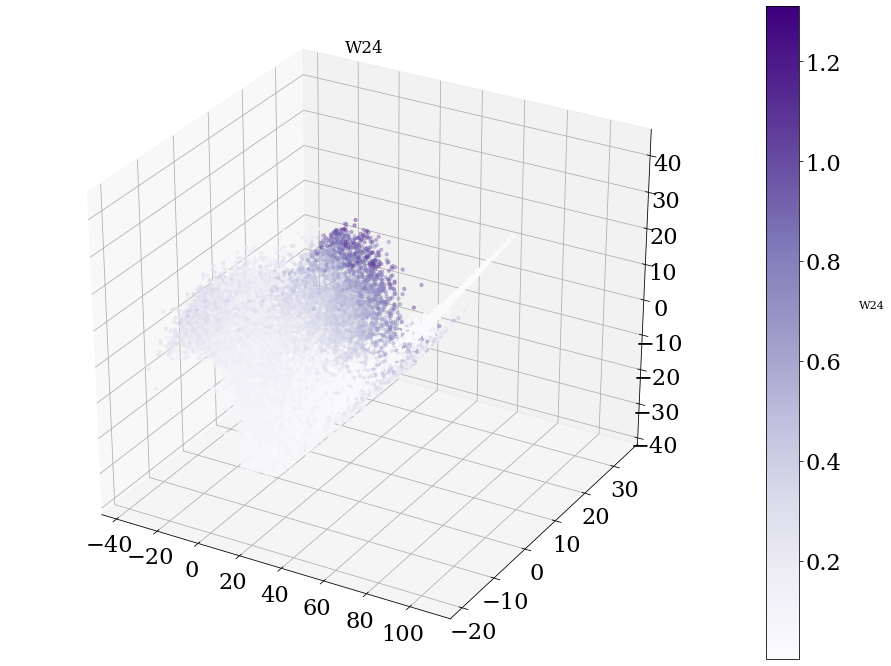

In [54]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_24, cmap="Purples", s=10.0)
ax.set_title("W24", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W24", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_24)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_24)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_24)[0])

-0.6376959314939871
0.5880118684642018
0.33411014087168495


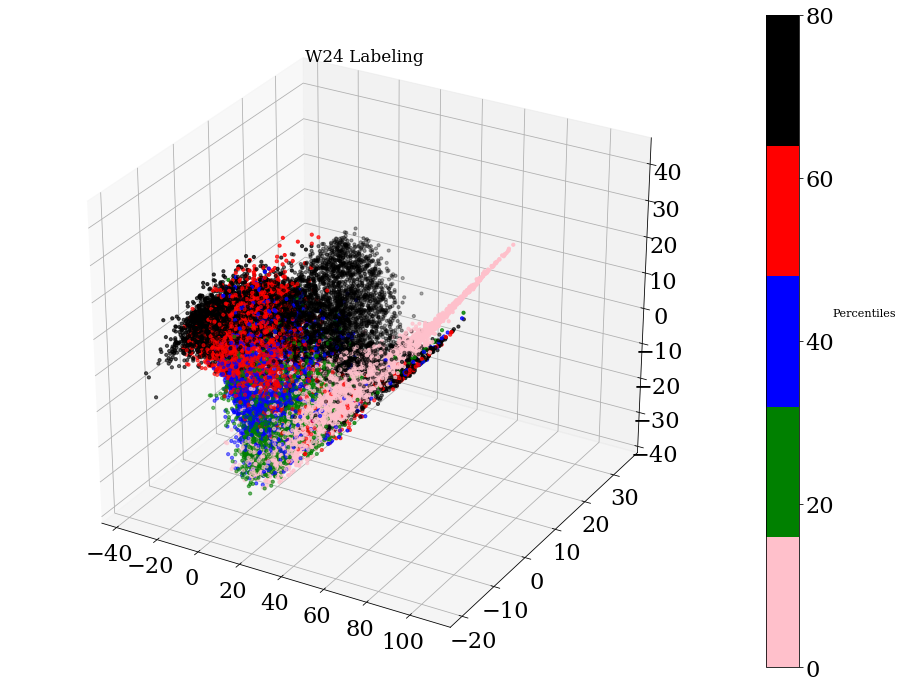

In [55]:
quintiles = np.percentile(W_24, [20,40,60,80])
out = np.searchsorted(quintiles,W_24)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W24 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.27239576761039985
0.8787225229381768
0.1439847330995358


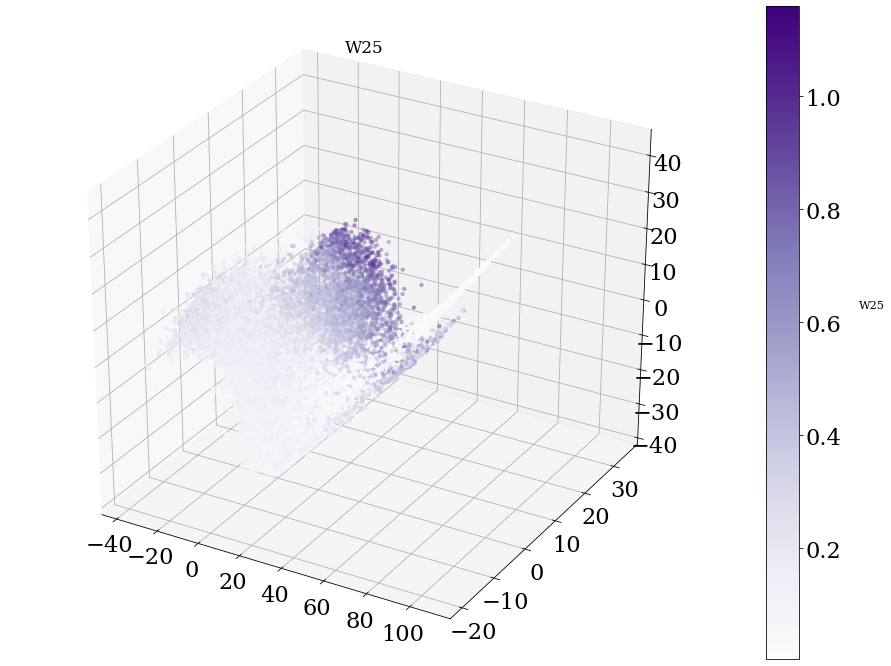

In [56]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_25, cmap="Purples", s=10.0)
ax.set_title("W25", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W25", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_25)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_25)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_25)[0])

-0.5945866489737346
0.6021501925991362
0.21828579399456585


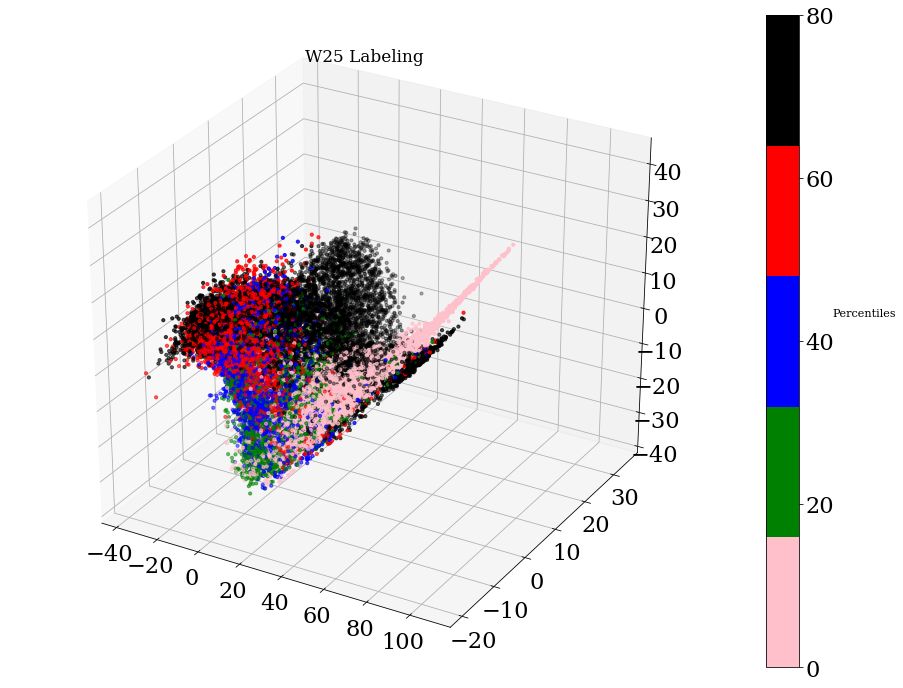

In [57]:
quintiles = np.percentile(W_25, [20,40,60,80])
out = np.searchsorted(quintiles,W_25)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W25 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.21385706229186263
0.8799393079848581
0.07725514275244022


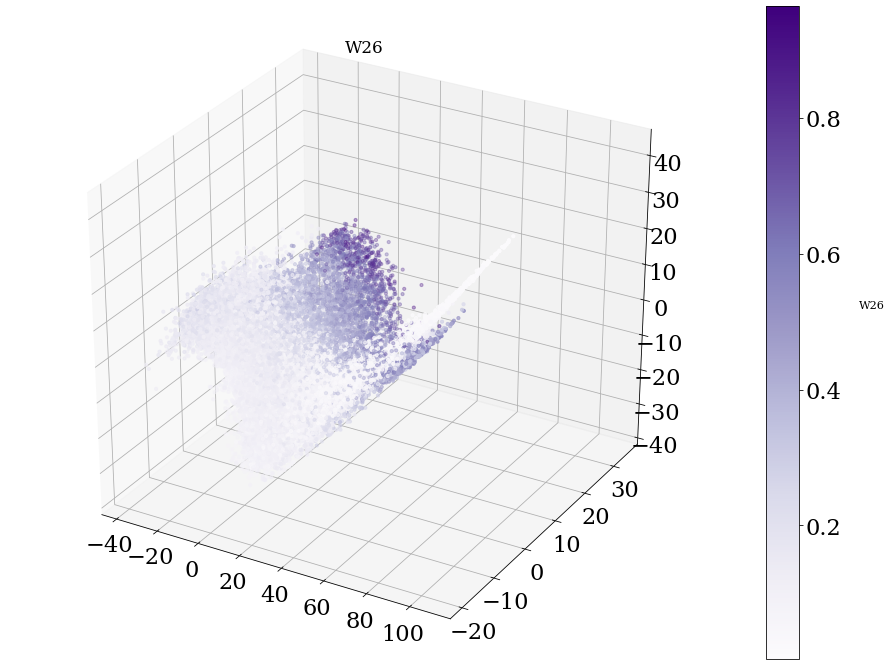

In [58]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_26, cmap="Purples", s=10.0)
ax.set_title("W26", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W26", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_26)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_26)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_26)[0])

-0.5167926424327413
0.593399343352883
0.10716817018419802


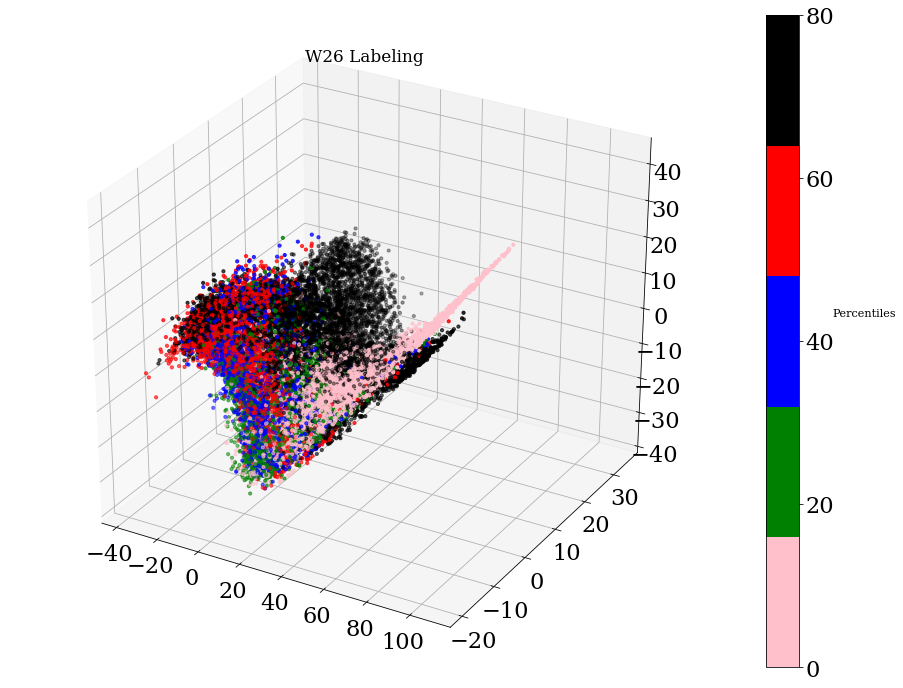

In [59]:
quintiles = np.percentile(W_26, [20,40,60,80])
out = np.searchsorted(quintiles,W_26)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W26 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.16658251870137966
0.8710552204833741
0.042354325399450214


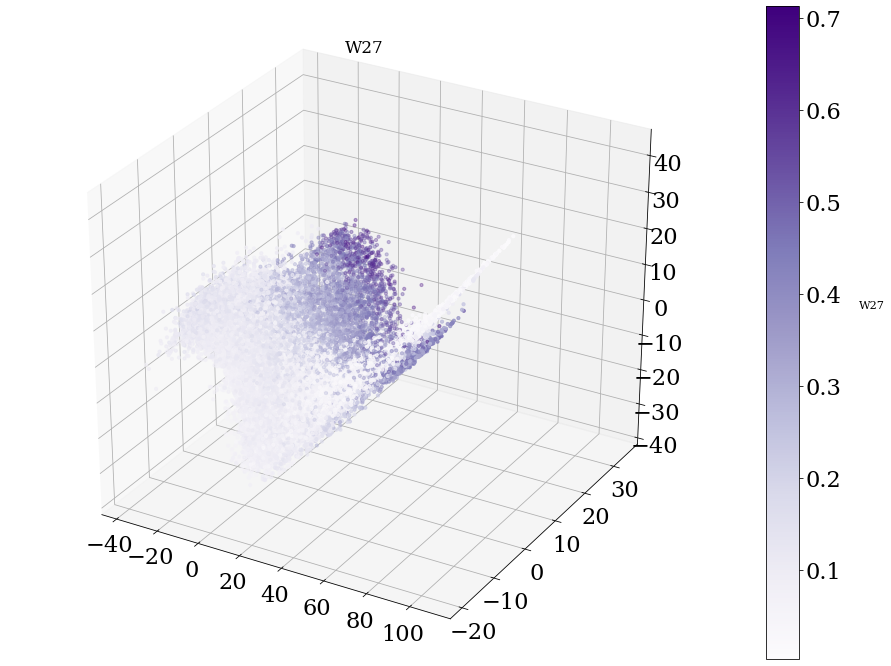

In [60]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_27, cmap="Purples", s=10.0)
ax.set_title("W27", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W27", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_27)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_27)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_27)[0])

-0.4281272592023386
0.5857845209307395
0.04208923601587387


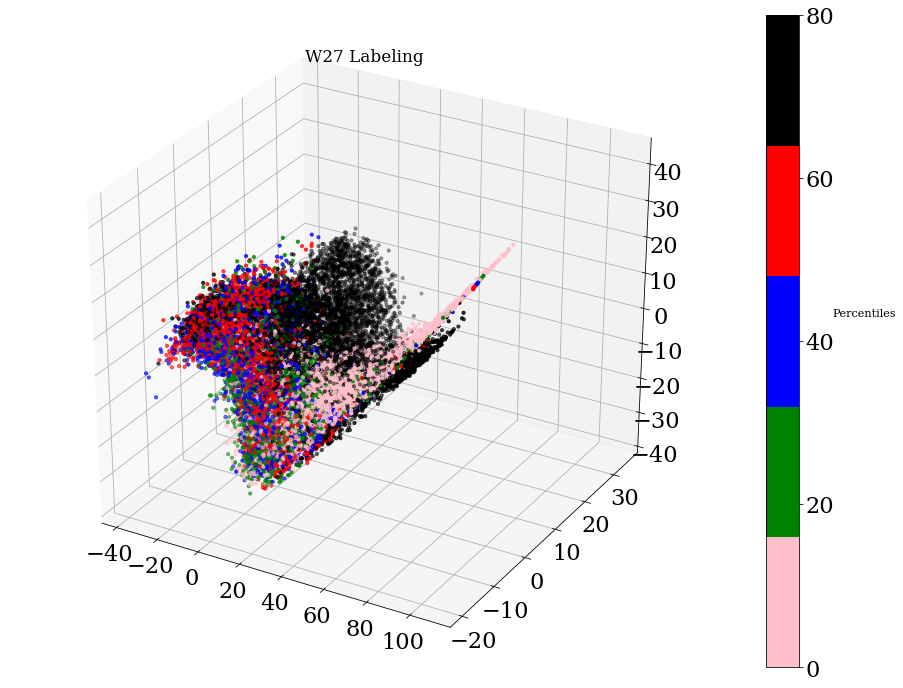

In [61]:
quintiles = np.percentile(W_27, [20,40,60,80])
out = np.searchsorted(quintiles,W_27)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W27 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

-0.1309769004339659
0.8640497914056368
0.02828562643638153


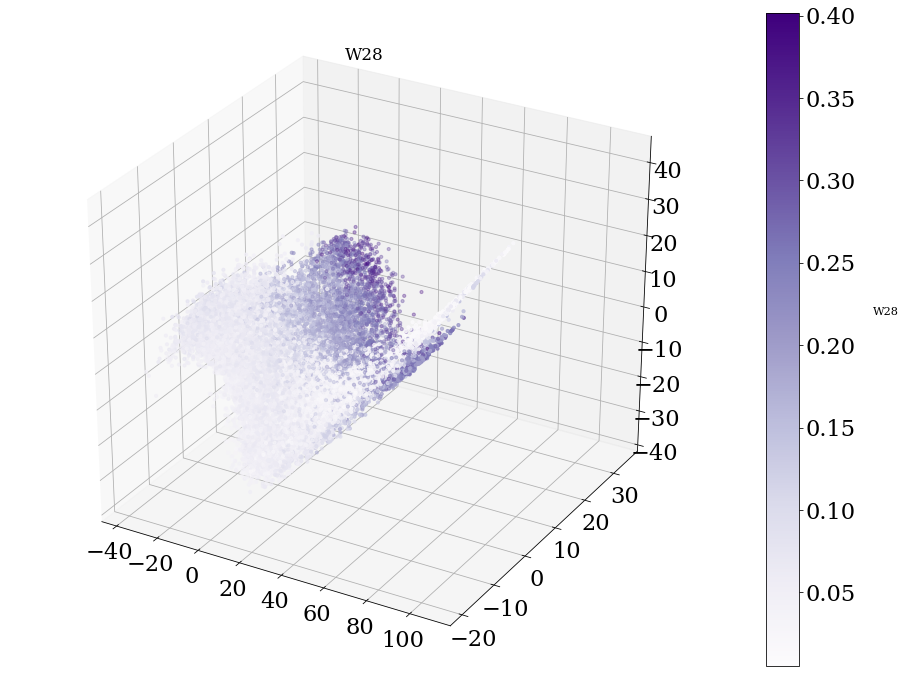

In [62]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_28, cmap="Purples", s=10.0)
ax.set_title("W28", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W28", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_28)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_28)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_28)[0])

-0.36802012040561805
0.5811221240897297
0.016052011368586857


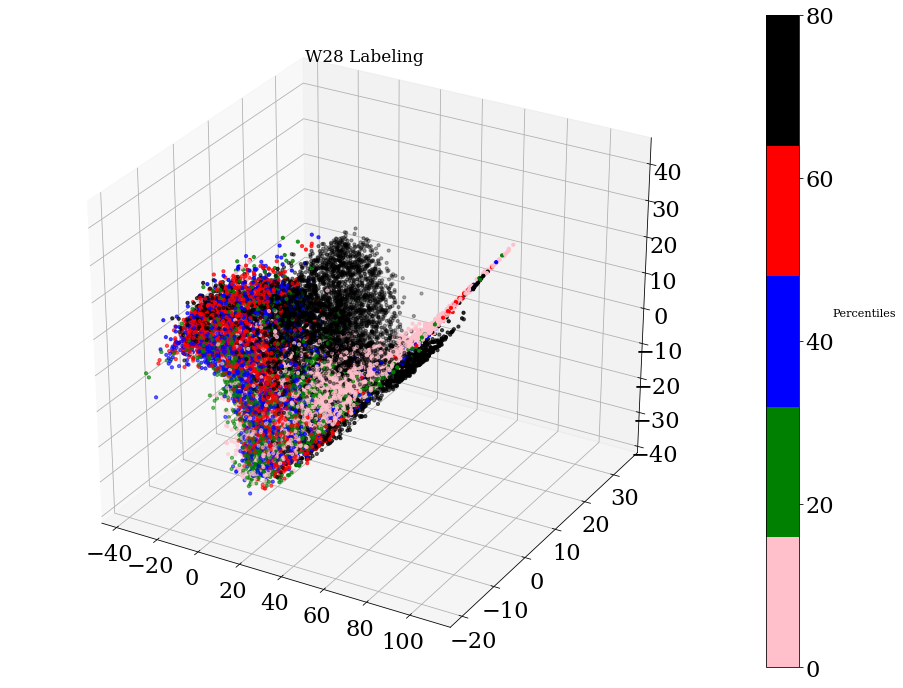

In [63]:
quintiles = np.percentile(W_28, [20,40,60,80])
out = np.searchsorted(quintiles,W_28)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W28 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])

/export/home/gmooers/miniconda3/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


nan
nan
nan


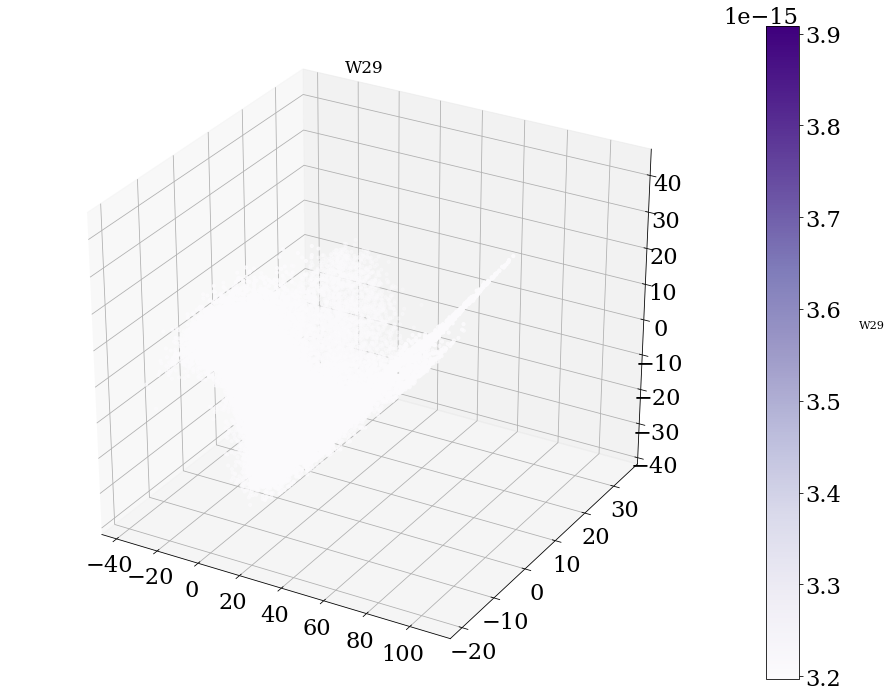

In [64]:
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=W_29, cmap="Purples", s=10.0)
ax.set_title("W29", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W29", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_29)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_29)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], W_29)[0])

nan
nan
nan


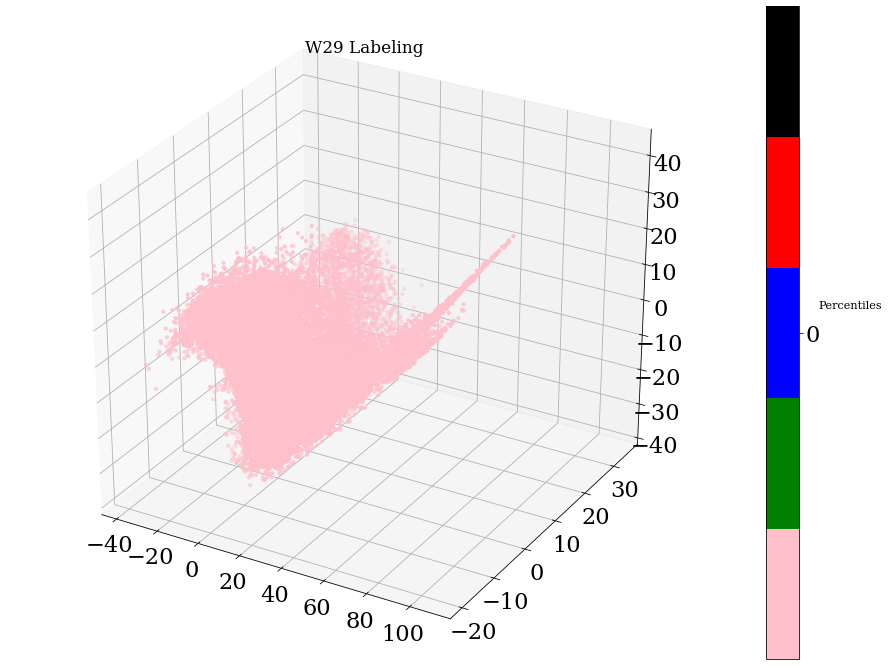

In [65]:
quintiles = np.percentile(W_29, [20,40,60,80])
out = np.searchsorted(quintiles,W_29)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111, projection='3d')

cp = ax.scatter(xs=z_test_tsne_track[:, 0], ys=z_test_tsne_track[:, 1], zs=z_test_tsne_track[:, 2], c=out, cmap=cmap, s=10.0)
ax.set_title("W29 Labeling", fontsize = fz*0.75)
#ax.set_xlim(-40,100)
#ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 2], out)[0])